# Wilfire burn scars in high latitudes

Climate change is causing changes in high-latitude regions, including warmer temperatures, longer growing seasons, and increased precipitation. While these changes can lead to more vegetation growth, they can also make these regions more susceptible to wildfires. And as high-latitude areas are mostly covered with permafrost, wildfires affect its layers, releasing large amounts of carbon dioxide and other greenhouse gases into the atmosphere and contributing to further warming and climate change. Alaska in recent years had an increasing number of large and severe wildfires in the state, which have posed significant threats to human communities, infrastructure, and the natural environment. In this study, the climate factors contributing to the cause of wildfires in Alaska for the study period 2001-2019 are explored. The result of regression coefficients and regression analyses reviled only a moderate correlation (within 0.6-0.8) between some climate characteristics (air temperature, soil temperature) and wildfire characteristics. Two different machine-learning models for identifying wildfire burn scars are employed in this study: built from scratch UNet model and pretrained UNet model (with ResNet101 encoder). The training dataset for these models includes 75 images/mask pairs from Sentinel-2, where each image includes in itself 6 bands (red, green, blue, NIR, NDVI, NDMI). Both models showed satisfactory results with all metrics over 0.90, and the visual evaluation indicated that prediction masks were mostly aligned with the ground truth. Built UNet model showed a slightly better in wildfire burn scar identification. The outcomes of this study are important for future research in the Alaska region or in the Arctic in general.

In [1]:
# All necessary imports
import os
import cv2
import time
import random
!pip install rasterio
import rasterio
from glob import glob
from tqdm import tqdm
from operator import add
import albumentations as A
from albumentations import HorizontalFlip, VerticalFlip, Rotate
from rasterio.plot import reshape_as_image, reshape_as_raster
from functools import partial

import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from torch.utils.data import random_split
import torch.nn as nn
import torch.nn.functional as F

!pip install segmentation-models-pytorch==0.2.1
!pip install rasterio
!pip install GDAL
!pip install torchmetrics

import pprint
import numpy as np
import xarray as xr
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import linregress
from IPython.display import Image
import segmentation_models_pytorch as smp
from torchmetrics.classification import ConfusionMatrix
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 1.2})
%matplotlib inline
from IPython.display import Image
from sklearn.metrics import accuracy_score, f1_score, jaccard_score, precision_score, recall_score

# using the following to avoid excessive prints of warnings
import warnings
warnings.filterwarnings('ignore')

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 56.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 88.6/88.6 kB 5.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 32.6 MB/s eta 0:00:00
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12402 sha256=f0d1cf5fdc83b6cee49c2f58672fcf2d8506f99cb8ec6cc418e70aaf6e2098d8
  Stored in directory: /root/.cache/pip/wheels/61/3a/b0/0b4c443c380bd934701b0a25e4aed76479e4fcaf1a6f955664
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60945 sha256=8b885859cc3a4582da2c17be068c1488ccbcdba856d021ba44565ae13d2548f9
  Stored in directory: /root/.cache/pip/wheels/35/cb/a5/8f534c60142835bfc889f9a482e4a67e0b817032d9c6883b64
Successfully built efficientnet-py

# Study area

Study area of this research: a geographic area within western longitudes of -141.0 to -162.35 and northern latitudes of 60.0 to 68.8. The research site covers a noteworthy expanse of the Boreal forests, where Alaska experiences the majority of its wildfires and all severe wildfires.

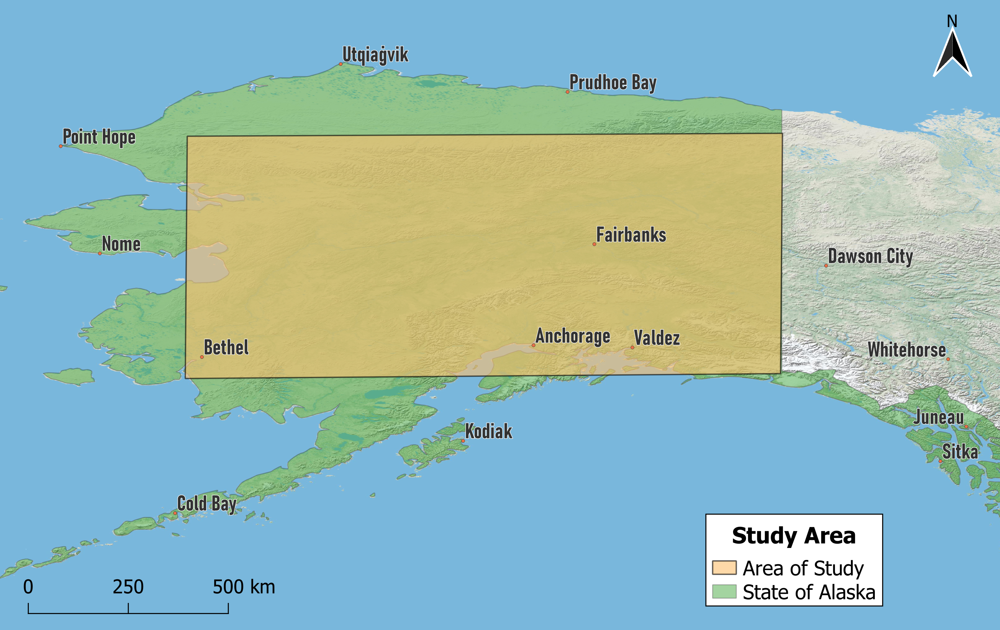

In [2]:
Image(filename='/content/drive/MyDrive/Thesis/Pics/only_study_area_alaska.png')

# Data

This study involves various types of data, which can be categorized into two distinct groups: 1) data used for analyzing Alaska's climate and 2) data utilized for building and training the machine learning algorithm. All datasets were gathered between the years 2001 and 2019. Data and its sources:

* locations of burnt areas; (https://daac.ornl.gov/ABOVE/guides/Burned_Area_Depth_AK_CA.html)
* number of ignitions; (https://daac.ornl.gov/cgi-bin/dsviewer.pl?ds_id=1812)
* number of wildfires; (https://dps.alaska.gov/fire/alaskafirestatistics)
* air temperature at 2 m; (https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land-monthly-means?tab=overview)
* soil temperature; (https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land-monthly-means?tab=overview)
* total precipitation; (https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land-monthly-means?tab=overview)
* snow cover; (https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-land-monthly-means?tab=overview)
* Normalized Difference Vegetation Index (NDVI); (https://code.earthengine.google.com/7ca68e1a567d4f17d472a7b05b9d8c45)
* Sentinel-2 images of wildfire burn scars. (https://apps.sentinel-hub.com/eo-browser/?zoom=10&lat=41.9&lng=12.5&themeId=DEFAULT-THEME&toTime=2023-03-21T09%3A31%3A16.608Z)




### Climate characteristics

In [3]:
# load the monthly mean climate data (air and soil temperatures, total precipitation, snow cover)
data = xr.open_dataset('/content/drive/MyDrive/Thesis/Data/Alaska_monthly_mean_data.nc')
# convert from xarray ds to df
df_data = data.to_dataframe(dim_order=None)
df_data

t2m       snowc        stl1        tp
longitude   latitude  time                                                    
-162.350006 68.800003 2001-01-01  250.686646   99.999451  268.091614  0.000477
                      2001-02-01  256.654175   99.999451  267.610992  0.000721
                      2001-03-01  249.902603   99.999451  266.075623  0.000279
                      2001-04-01  257.481598   99.999451  266.983490  0.000824
                      2001-05-01  264.520569  100.000977  267.457062  0.000430
...                                      ...         ...         ...       ...
-141.050003 60.000000 2019-08-01  283.881317   52.738831  279.022949  0.001721
                      2019-09-01  281.279419   52.738831  277.236267  0.008799
                      2019-10-01  276.074707   57.545616  274.162384  0.011286
                      2019-11-01  275.455597   67.192757  273.566315  0.014200
                      2019-12-01  273.453552   98.719162  273.365265  0.017872

[4342488 rows x 4 columns]

In [4]:
# change temperature unit to celicius
df_data['stl1'] = df_data['stl1'] - 273.15
df_data['t2m'] = df_data['t2m'] - 273.15
# change precipitation unit to mm
df_data['tp'] = df_data['tp'] * 1000
# set index
df_data = pd.DataFrame(df_data).reset_index()
df_data

,longitude,latitude,time,t2m,snowc,stl1,tp
0,-162.350006,68.800003,2001-01-01,-22.463354,99.999451,-5.058386,0.476981
1,-162.350006,68.800003,2001-02-01,-16.495825,99.999451,-5.539008,0.721291
2,-162.350006,68.800003,2001-03-01,-23.247397,99.999451,-7.074377,0.278601
3,-162.350006,68.800003,2001-04-01,-15.668402,99.999451,-6.166510,0.824474
4,-162.350006,68.800003,2001-05-01,-8.629431,100.000977,-5.692938,0.429716
...,...,...,...,...,...,...,...
4342483,-141.050003,60.000000,2019-08-01,10.731317,52.738831,5.872949,1.721170
4342484,-141.050003,60.000000,2019-09-01,8.129419,52.738831,4.086267,8.798878
4342485,-141.050003,60.000000,2019-10-01,2.924707,57.545616,1.012384,11.285927
4342486,-141.050003,60.000000,2019-11-01,2.305597,67.192757,0.416315,14.200356


In [5]:
# extracting mean monthly values for the whole study area
# air temperature
temp_mean = df_data.groupby("time")["t2m"].agg(["mean"])
# precipitation
precip_mean = df_data.groupby("time")["tp"].agg(["mean"])
# soil temperature
soil_temp_mean = df_data.groupby("time")["stl1"].agg(["mean"])
# snow cover
snow_cover_mean = df_data.groupby("time")["snowc"].agg(["mean"])
# extracting unique values from time column
Time = df_data['time'].unique()

In [6]:
# Creating a new dataframe with monthly mean viribles for the whole study area
dataset = pd.DataFrame()
dataset['Time'] = Time
dataset['Air temperature, °C'] = temp_mean[["mean"]].values
dataset['Precipitation, mm'] = precip_mean[["mean"]].values
dataset['Soil temperature, °C'] = soil_temp_mean[["mean"]].values
dataset['Snow cover, %'] = snow_cover_mean[["mean"]].values
dataset

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %"
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462
...,...,...,...,...,...
223,2019-08-01,10.457738,3.049905,10.537934,5.465585
224,2019-09-01,5.896062,3.205314,5.995337,13.023705
225,2019-10-01,-3.090928,3.122654,-0.028766,62.783615
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520


### NDVI

In [7]:
# load the NDVI dataset
ndvi_file = pd.read_csv('/content/drive/MyDrive/Thesis/Data/NDVI_monthly_mean.csv')
ndvi_file

,Unnamed: 0,system:index,ALAND,AWATER,DIVISION,FUNCSTAT,GEOID,INTPTLAT,INTPTLON,LSAD,...,NAME,REGION,STATEFP,STATENS,STUSPS,date,mean,month,year,.geo
0,0,0_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2001-01-01T00:00:00,0.010267,1.0,2001.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
1,1,1_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2001-02-01T00:00:00,-0.029232,2.0,2001.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
2,2,2_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2001-03-01T00:00:00,-0.009433,3.0,2001.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
3,3,3_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2001-04-01T00:00:00,-0.008643,4.0,2001.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
4,4,4_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2001-05-01T00:00:00,0.025074,5.0,2001.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
223,55,55_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2019-08-01T00:00:00,0.226639,8.0,2019.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
224,56,56_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2019-09-01T00:00:00,0.153316,9.0,2019.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
225,57,57_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2019-10-01T00:00:00,0.068827,10.0,2019.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."
226,58,58_0000000000000000001d,1477946266785,245390495931,9,A,2,63.346191,-152.837069,0,...,Alaska,4,2,1785533,AK,2019-11-01T00:00:00,0.023764,11.0,2019.0,"{""type"":""MultiPolygon"",""coordinates"":[[[[-155...."


In [8]:
# extracting only mean monthly NDVI values
NDVI = ndvi_file[["mean"]].values
# add NDVI values to the dataset
dataset['NDVI'] = NDVI
dataset

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367,0.010267
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743,-0.029232
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327,-0.009433
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998,-0.008643
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462,0.025074
...,...,...,...,...,...,...
223,2019-08-01,10.457738,3.049905,10.537934,5.465585,0.226639
224,2019-09-01,5.896062,3.205314,5.995337,13.023705,0.153316
225,2019-10-01,-3.090928,3.122654,-0.028766,62.783615,0.068827
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520,0.023764


### Wildfire data

Monthly number of ignitions and burned area have been calculated via QGIS and therefore is written manually.

In [9]:
# Number of Ignitions
ignitions = [0,0,0,0,0,1,5,2,1,0,0,0, # 2001
            0,0,0,0,14,16,36,7,0,0,0,0, # 2002
            0,0,0,0,7,17,6,3,0,0,0,0, # 2003
            0,0,0,0,1,46,49,29,1,0,0,0, # 2004
            0,0,0,1,4,77,49,27,0,0,0,0, # 2005
            0,0,0,0,3,10,10,1,0,0,0,0, # 2006
            0,0,0,0,6,13,54,3,1,0,0,0, # 2007
            0,0,0,0,1,8,16,0,2,0,0,0, # 2008
            0,0,0,0,20,23,43,4,1,0,0,0, # 2009
            0,0,0,0,39,28,24,4,2,0,0,0, # 2010
            0,0,0,0,16,2,13,1,0,0,0,0, # 2011
            0,0,0,0,3,14,4,6,0,0,0,0, # 2012
            0,0,0,0,12,50,20,6,0,0,0,0, # 2013
            0,0,0,1,5,5,7,5,1,0,0,0, # 2014
            0,0,0,0,12,208,24,5,0,0,0,0, # 2015
            0,0,0,0,3,13,56,0,4,0,0,0, # 2016
            0,0,0,0,3,38,27,3,0,0,0,0, # 2017
            0,0,0,0,4,37,22,0,1,0,0,0, # 2018
            np.nan,np.nan,np.nan,np.nan,np.nan,np.nan,
            np.nan,np.nan,np.nan,np.nan,np.nan,np.nan] # 2019
# Burnt area
burned_area = [0,0,0,0.4,0.8,0,157.2,2.8,1.1,0,0,0, # 2001
              0,0,0,0,1268.1,1657.4,2006.8,2242.1,521.8,0.5,0.3,0, # 2002
              0,0,0,0.4,165.8,1184.5,710.8,307.2,0.5,0,0,0, # 2003
              0,0,0,0.3,0.5,11744.8,9395.8,1644.3,703.7,0,0.1,0, # 2004
              0,0,0,0.2,0.6,4613.5,3691.8,10147.5,0.2,0.1,0.1,0, # 2005
              0,0,0,0.1,1.1,643.9,57.2,12.3,0.6,0.2,0,0, # 2006
              0,0,0,1.2,134.8,276.4,623.9,159.8,5.3,0.5,0.1,0, # 2007
              0,0,0,0,0.6,23.5,301.6,7.1,2.1,0.2,0,0, # 2008
              0,0,0,1.4,321.8,1667.4,8668.1,448.6,4.3,1.2,0.1,0, # 2009
              0,0,0.1,0.1,1911,573.3,477.8,210.6,11.8,0.1,0.1,0, # 2010
              0,0,0,0.2,529.2,151.2,52.9,20.6,1.8,0,0,0, # 2011
              0,0,0,0,1.3,410.8,88,82.2,4.5,0.1,0,0, # 2012
              0,0,0,0,26.3,3867.6,483.5,435.1,12.6,9.4,0,0, # 2013
              0,0,0,0.5,523.7,73.9,11.2,6.5,0.3,0,0,0, # 2014
              0,0,0,0.3,163.8,10703.4,4940,658.7,0.6,0,0,0, # 2015
              0,0,0.8,1.2,75.8,160.6,1364.8,1.4,0.9,0.1,0,0, # 2016
              0,0,0.2,0.4,1.8,209,1776.3,101,0.6,0.4,0,0, # 2017
              0,0,0,0,0.5,944.2,557.6,0.5,0.8,0,0,0, # 2018
              0,0,0.2,1.2,7.8,3146.8,6818.1,278.4,21.3,0,0,0] # 2019

In [10]:
# Add number of ignitions and burnt area to the dataset
dataset['Number of Ignitions'] = ignitions
dataset['Burned Area, km$^2$'] = burned_area
dataset

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$"
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367,0.010267,0.0,0.0
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743,-0.029232,0.0,0.0
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327,-0.009433,0.0,0.0
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998,-0.008643,0.0,0.4
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462,0.025074,0.0,0.8
...,...,...,...,...,...,...,...,...
223,2019-08-01,10.457738,3.049905,10.537934,5.465585,0.226639,NaN,278.4
224,2019-09-01,5.896062,3.205314,5.995337,13.023705,0.153316,NaN,21.3
225,2019-10-01,-3.090928,3.122654,-0.028766,62.783615,0.068827,NaN,0.0
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520,0.023764,NaN,0.0


Annual wildfire reports provide only the sum of wildfires for each year starting from 2004.

In [11]:
# data from fire reports
wildfires = [405, 342, 300, 298, 274, 875, 1099, 479, 410, 542, 341, 587, 476, 373, 413, 694]

# Climate analysis

### Time Series

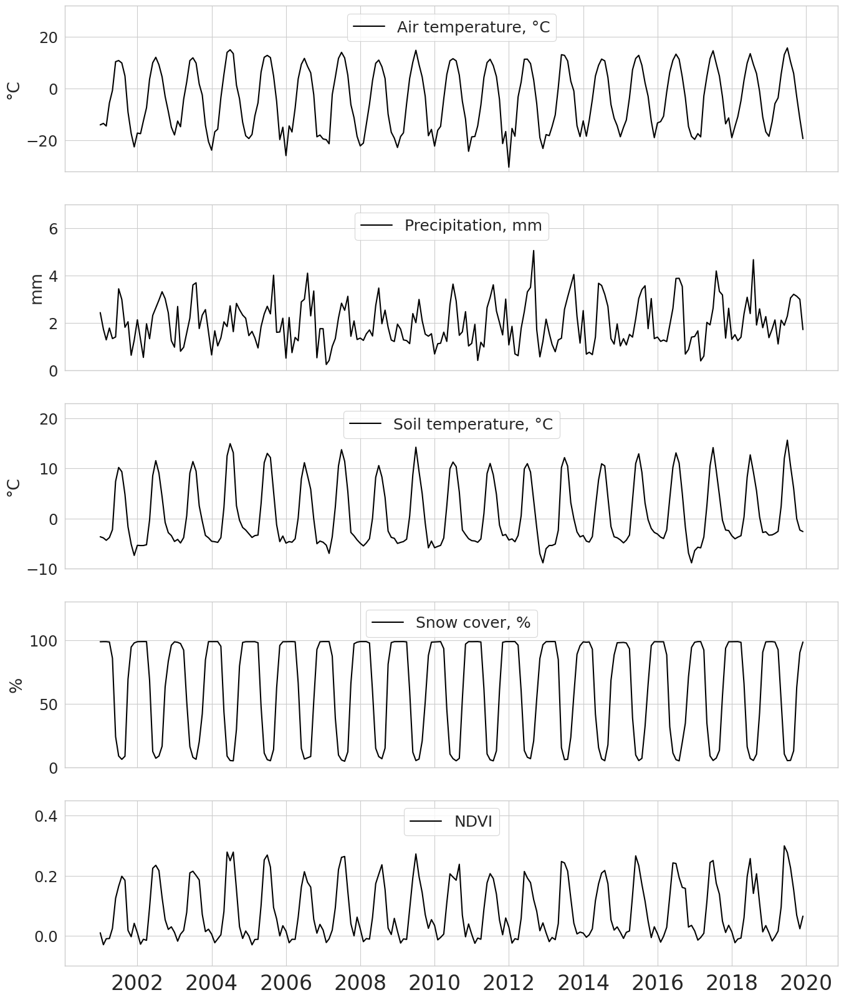

In [12]:
# visualizing time series of climate data and NDVI
fig, ax = plt.subplots(5, 1, figsize=(16, 20), sharex=True);
# air Temperature
ax[0].plot(dataset['Time'], dataset['Air temperature, °C'], c="k", label='Air temperature, °C',lw=1.5);
ax[0].legend(loc='upper center', fontsize=18);
ax[0].set_ylim(-32, 32)
ax[0].set_ylabel('°C')
# precipitation
ax[1].plot(dataset['Time'], dataset['Precipitation, mm'], c="k", label='Precipitation, mm',lw=1.5);
ax[1].legend(loc='upper center', fontsize=18);
ax[1].set_ylim(0,7)
ax[1].set_ylabel('mm')
# soil temperature
ax[2].plot(dataset['Time'], dataset['Soil temperature, °C'], c="k", label='Soil temperature, °C',lw=1.5);
ax[2].legend(loc='upper center', fontsize=18);
ax[2].set_ylim(-10,23)
ax[2].set_ylabel('°C')
# snow cover
ax[3].plot(dataset['Time'], dataset['Snow cover, %'], c="k", label='Snow cover, %',lw=1.5);
ax[3].legend(loc='upper center', fontsize=18);
ax[3].set_ylim(0,130)
ax[3].set_ylabel('%')
# NDVI
ax[4].plot(dataset['Time'], dataset['NDVI'], c="k", label='NDVI',lw=1.5);
ax[4].legend(loc='upper center', fontsize=18);
ax[4].set_ylim(-0.1,0.45);
plt.xticks(fontsize=24);
# saving the figure
plt.savefig('all_climate_monthly_data.png', dpi=300, bbox_inches='tight')

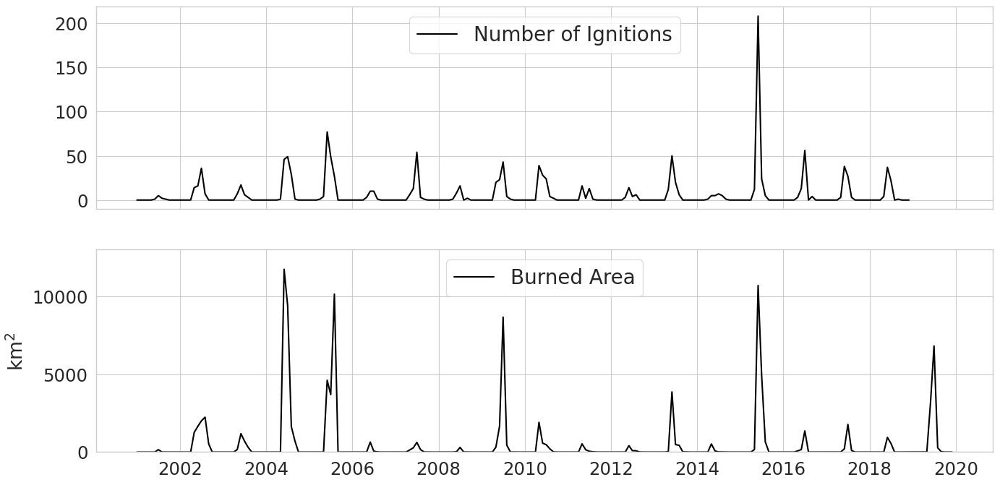

In [13]:
# visualizing wildfire data
fig, ax = plt.subplots(2, 1, figsize=(16, 8), sharex=True);
# number of ignitions
ax[0].plot(dataset['Time'], dataset['Number of Ignitions'], c="k", label='Number of Ignitions',lw=1.5);
ax[0].legend(loc='upper center', fontsize=20);
# burnt area
ax[1].plot(dataset['Time'], dataset['Burned Area, km$^2$'], c="k", label='Burned Area',lw=1.5);
ax[1].legend(loc='upper center', fontsize=20);
ax[1].set_ylabel('km$^2$')
ax[1].set_ylim(0, 13000);
# saving the figure
plt.savefig('fire_data_monthly.png', dpi=300, bbox_inches='tight')

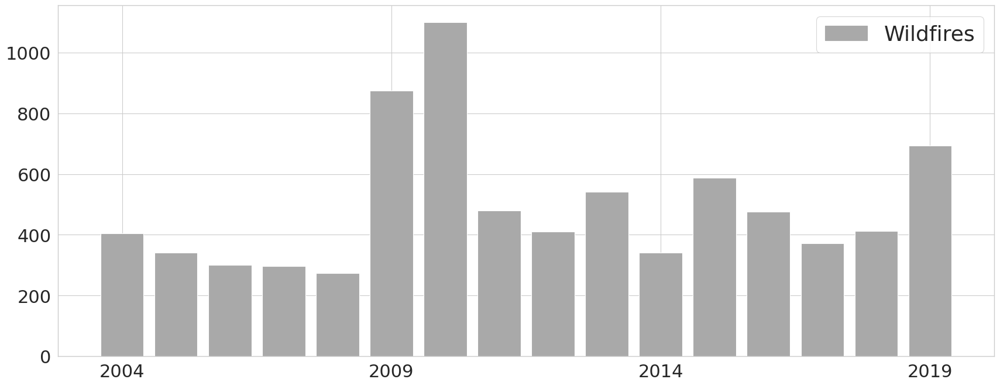

In [14]:
# visualizing annual number of wildfires
Years = [i for i in range(2004,2020)]

fig = plt.figure(figsize=(16, 6))
ax = fig.add_axes([0,0,1,1])
ax.bar(Years, wildfires, color="darkgrey");
plt.xticks([2004, 2009, 2014, 2019],  fontsize=22)
plt.yticks(fontsize=22)
colors = {'Wildfires':'darkgrey'}
labels = list(colors.keys())
handles = [plt.Rectangle((0,0),1,1, color=colors[label]) for label in labels]
plt.legend(handles, labels, fontsize=26)
# saving the figure
plt.savefig('histo.png', dpi=300, bbox_inches='tight')

### Correlation coefficients

To understand the relationship between monthly mean climate characteristics and monthly burnt area as well as the number of ignitions, Pearson, Spearman, and Kendall coefficients are computed.

**Burnt area**

In [23]:
# Extract the variables for NDVI and Burned area
subset = dataset.dropna(subset=['NDVI', 'Burned Area, km$^2$'])
xs = subset['NDVI']
ys = subset['Burned Area, km$^2$']

# Pearson's correlation coefficient
res_pearson = stats.pearsonr(xs, ys)
# Spearman's rank correlation coefficient
res_spearman = stats.spearmanr(xs,ys, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
res_kendall = stats.kendalltau(xs, ys)

print('The result for correlation coefficients between NDVI and Burned area:')
print(' ')
print('Pearson: ' + str(res_pearson))
print('Spearman: ' + str(res_spearman))
print('Kendall: ' + str(res_kendall))

The result for correlation coefficients between NDVI and Burned area:
 
Pearson: PearsonRResult(statistic=0.48598816686760415, pvalue=6.449397980573952e-15)
Spearman: SignificanceResult(statistic=0.8049729582339127, pvalue=3.7975247574564867e-53)
Kendall: SignificanceResult(statistic=0.6290046932947122, pvalue=3.839780317436086e-40)


In [24]:
# Extract the variables for Precipitation and Burned area
subset_1 = dataset.dropna(subset=['Precipitation, mm', 'Burned Area, km$^2$'])
xs_1 = subset_1['Precipitation, mm']
ys_1 = subset_1['Burned Area, km$^2$']

# Pearson's correlation coefficient
res_pearson_1 = stats.pearsonr(xs_1, ys_1)
# Spearman's rank correlation coefficient
res_spearman_1 = stats.spearmanr(xs_1,ys_1, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
res_kendall_1 = stats.kendalltau(xs_1, ys_1)

print('The result for correlation coefficients between Precipitation and Burned area:')
print(' ')
print('Pearson: ' + str(res_pearson_1))
print('Spearman: ' + str(res_spearman_1))
print('Kendall: ' + str(res_kendall_1))

The result for correlation coefficients between Precipitation and Burned area:
 
Pearson: PearsonRResult(statistic=0.10279323080246025, pvalue=0.12169086175903511)
Spearman: SignificanceResult(statistic=0.499735119726048, pvalue=8.305502449432585e-16)
Kendall: SignificanceResult(statistic=0.34743013798409295, pvalue=2.383479752690645e-13)


In [25]:
# Extract the variables for Air temperature and Burned area
subset_2 = dataset.dropna(subset=['Air temperature, °C', 'Burned Area, km$^2$'])
xs_2 = subset_2['Air temperature, °C']
ys_2 = subset_2['Burned Area, km$^2$']

# Pearson's correlation coefficient
res_pearson_2 = stats.pearsonr(xs_2, ys_2)
# Spearman's rank correlation coefficient
res_spearman_2 = stats.spearmanr(xs_2,ys_2, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
res_kendall_2 = stats.kendalltau(xs_2, ys_2)

print('The result for correlation coefficients between Air temperature and Burned area:')
print(' ')
print('Pearson: ' + str(res_pearson_2))
print('Spearman: ' + str(res_spearman_2))
print('Kendall: ' + str(res_kendall_2))

The result for correlation coefficients between Air temperature and Burned area:
 
Pearson: PearsonRResult(statistic=0.390210281999174, pvalue=1.0387817545372564e-09)
Spearman: SignificanceResult(statistic=0.8833327041340777, pvalue=2.5689442828751142e-76)
Kendall: SignificanceResult(statistic=0.725443763414848, pvalue=8.1992882863630355e-53)


In [26]:
# Extract the variables for Soil temperature and Burned area
subset_3 = dataset.dropna(subset=['Soil temperature, °C', 'Burned Area, km$^2$'])
xs_3 = subset_3['Soil temperature, °C']
ys_3 = subset_3['Burned Area, km$^2$']

# Pearson's correlation coefficient
res_pearson_3 = stats.pearsonr(xs_3, ys_3)
# Spearman's rank correlation coefficient
res_spearman_3 = stats.spearmanr(xs_3,ys_3, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
res_kendall_3 = stats.kendalltau(xs_3, ys_3)

print('The result for correlation coefficients between Soil temperature and Burned area:')
print(' ')
print('Pearson: ' + str(res_pearson_3))
print('Spearman: ' + str(res_spearman_3))
print('Kendall: ' + str(res_kendall_3))

The result for correlation coefficients between Soil temperature and Burned area:
 
Pearson: PearsonRResult(statistic=0.4780572937085963, pvalue=2.0193392331692186e-14)
Spearman: SignificanceResult(statistic=0.8348217235384685, pvalue=1.6473126049622198e-60)
Kendall: SignificanceResult(statistic=0.6624701690099065, pvalue=2.4543423264618083e-44)


In [27]:
# Extract the variables for Number of Ignitions and Burned area
subset_4 = dataset.dropna(subset=['Number of Ignitions', 'Burned Area, km$^2$'])
xs_4 = subset_4['Number of Ignitions']
ys_4 = subset_4['Burned Area, km$^2$']

# Pearson's correlation coefficient
res_pearson_4 = stats.pearsonr(xs_4, ys_4)
# Spearman's rank correlation coefficient
res_spearman_4 = stats.spearmanr(xs_4,ys_4, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
res_kendall_4 = stats.kendalltau(xs_4, ys_4)

print('The result for correlation coefficients between Number of Ignitions and Burned area:')
print(' ')
print('Pearson: ' + str(res_pearson_4))
print('Spearman: ' + str(res_spearman_4))
print('Kendall: ' + str(res_kendall_4))

The result for correlation coefficients between Number of Ignitions and Burned area:
 
Pearson: PearsonRResult(statistic=0.7264643929720859, pvalue=1.0223043487487554e-36)
Spearman: SignificanceResult(statistic=0.8497720923587553, pvalue=1.995809244760646e-61)
Kendall: SignificanceResult(statistic=0.7517230336101561, pvalue=4.753599969918838e-43)


In [28]:
# Extract the variables for Snow cover and Burned area
subset_5 = dataset.dropna(subset=['Snow cover, %', 'Burned Area, km$^2$'])
xs_5 = subset_5['Snow cover, %']
ys_5 = subset_5['Burned Area, km$^2$']

# Pearson's correlation coefficient
res_pearson_5 = stats.pearsonr(xs_5, ys_5)
# Spearman's rank correlation coefficient
res_spearman_5 = stats.spearmanr(xs_5,ys_5, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
res_kendall_5 = stats.kendalltau(xs_5, ys_5)

print('The result for correlation coefficients between Snow cover and Burned area:')
print(' ')
print('Pearson: ' + str(res_pearson_5))
print('Spearman: ' + str(res_spearman_5))
print('Kendall: ' + str(res_kendall_5))

The result for correlation coefficients between Snow cover and Burned area:
 
Pearson: PearsonRResult(statistic=-0.3682195700156184, pvalue=9.919303805725475e-09)
Spearman: SignificanceResult(statistic=-0.8289211357240669, pvalue=6.084854337751994e-59)
Kendall: SignificanceResult(statistic=-0.6411486394476865, pvalue=1.286600580711848e-41)


In [29]:
# Print the table of all coeffitients for Brned area
print('     THE RESULT OF PEARSON, SPEARMAN AND KENDALL CORRELATION COEFFICIENTS BETWEEN BURNT AREA AND OTHER CHARACTERISTICS')
print('---------------------------------------------------------------------------------------------------------------------------')
print('|                                                        Burned Area                                                      |')
print('|-------------------------------------------------------------------------------------------------------------------------|')
print('|               Air temperature  |  Total precipitation  |  Soil temperature  |  Snow cover  |  NDVI  |  Nr of Ignitions  |')
print('|-------------------------------------------------------------------------------------------------------------------------|')
print('|  Pearson           ' + str(round(res_pearson_2[0],2)) + '        |          ' +  str(round(res_pearson_1[0],2)) +
      '          |        ' + str(round(res_pearson_3[0],2)) + '        |    ' + str(round(res_pearson_5[0],2)) + '     |  ' +
      str(round(res_pearson[0],2)) + '  |        ' + str(round(res_pearson_4[0],2)) + '       |')
print('|-------------------------------------------------------------------------------------------------------------------------|')
print('| Spearman           ' + str(round(res_spearman_2[0],2)) + '        |          ' +  str(round(res_spearman_1[0],2)) +
      '          |        ' + str(round(res_spearman_3[0],2)) + '        |    ' + str(round(res_spearman_5[0],2)) + '     |  ' +
      str(round(res_spearman[0],2)) + '   |        ' + str(round(res_spearman_4[0],2)) + '       |')
print('|-------------------------------------------------------------------------------------------------------------------------|')
print('|  Kendall           ' + str(round(res_kendall_2[0],2)) + '        |          ' +  str(round(res_kendall_1[0],2)) +
      '         |        ' + str(round(res_kendall_3[0],2)) + '        |    ' + str(round(res_kendall_5[0],2)) + '     |  ' +
      str(round(res_kendall[0],2)) + '  |        ' + str(round(res_kendall_4[0],2)) + '       |')
print('---------------------------------------------------------------------------------------------------------------------------')

     THE RESULT OF PEARSON, SPEARMAN AND KENDALL CORRELATION COEFFICIENTS BETWEEN BURNT AREA AND OTHER CHARACTERISTICS
---------------------------------------------------------------------------------------------------------------------------
|                                                        Burned Area                                                      |
|-------------------------------------------------------------------------------------------------------------------------|
|               Air temperature  |  Total precipitation  |  Soil temperature  |  Snow cover  |  NDVI  |  Nr of Ignitions  |
|-------------------------------------------------------------------------------------------------------------------------|
|  Pearson           0.39        |          0.1          |        0.48        |    -0.37     |  0.49  |        0.73       |
|-------------------------------------------------------------------------------------------------------------------------|
| Spearman   

**Number of ignitions**

In [30]:
# Extract the variables for NDVI and Number of Ignitions
ign_subset = dataset.dropna(subset=['NDVI', 'Number of Ignitions'])
x_is = ign_subset['NDVI']
y_is = ign_subset['Number of Ignitions']

# Pearson's correlation coefficient
ign_res_pearson = stats.pearsonr(x_is, y_is)
# Spearman's rank correlation coefficient
ign_res_spearman = stats.spearmanr(x_is, y_is, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
ign_res_kendall = stats.kendalltau(x_is, y_is)

print('The result for correlation coefficients between NDVI and Number of Ignitions:')
print(' ')
print('Pearson: ' + str(ign_res_pearson))
print('Spearman: ' + str(ign_res_spearman))
print('Kendall: ' + str(ign_res_kendall))

The result for correlation coefficients between NDVI and Number of Ignitions:
 
Pearson: PearsonRResult(statistic=0.5231919232326492, pvalue=1.4121929921722822e-16)
Spearman: SignificanceResult(statistic=0.7744629395693414, pvalue=1.951517971476343e-44)
Kendall: SignificanceResult(statistic=0.6209439621757559, pvalue=8.356062566237474e-34)


In [31]:
# Extract the variables for Precipitation and Number of Ignitions
ign_subset_1 = dataset.dropna(subset=['Precipitation, mm', 'Number of Ignitions'])
x_is_1 = ign_subset_1['Precipitation, mm']
y_is_1 = ign_subset_1['Number of Ignitions']

# Pearson's correlation coefficient
ign_res_pearson_1 = stats.pearsonr(x_is_1, y_is_1)
# Spearman's rank correlation coefficient
ign_res_spearman_1 = stats.spearmanr(x_is_1, y_is_1, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
ign_res_kendall_1 = stats.kendalltau(x_is_1, y_is_1)

print('The result for correlation coefficients between Precipitation and Number of Ignitions:')
print(' ')
print('Pearson: ' + str(ign_res_pearson_1))
print('Spearman: ' + str(ign_res_spearman_1))
print('Kendall: ' + str(ign_res_kendall_1))

The result for correlation coefficients between Precipitation and Number of Ignitions:
 
Pearson: PearsonRResult(statistic=0.15343876309027737, pvalue=0.02411028735744353)
Spearman: SignificanceResult(statistic=0.4197986975876249, pvalue=1.2457441539188352e-10)
Kendall: SignificanceResult(statistic=0.3084573827967526, pvalue=1.7410988916508188e-09)


In [32]:
# Extract the variables for Air temperature and Number of Ignitions
ign_subset_2 = dataset.dropna(subset=['Air temperature, °C', 'Number of Ignitions'])
x_is_2 = ign_subset_2['Air temperature, °C']
y_is_2 = ign_subset_2['Number of Ignitions']

# Pearson's correlation coefficient
ign_res_pearson_2 = stats.pearsonr(x_is_2, y_is_2)
# Spearman's rank correlation coefficient
ign_res_spearman_2 = stats.spearmanr(x_is_2, y_is_2, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
ign_res_kendall_2 = stats.kendalltau(x_is_2, y_is_2)

print('The result for correlation coefficients between Air temperature and Number of Ignitions:')
print(' ')
print('Pearson: ' + str(ign_res_pearson_2))
print('Spearman: ' + str(ign_res_spearman_2))
print('Kendall: ' + str(ign_res_kendall_2))

The result for correlation coefficients between Air temperature and Number of Ignitions:
 
Pearson: PearsonRResult(statistic=0.43730205676030603, pvalue=1.6765606179608777e-11)
Spearman: SignificanceResult(statistic=0.8099312957831035, pvalue=1.7378359202103027e-51)
Kendall: SignificanceResult(statistic=0.6583259526888601, pvalue=8.734437503887084e-38)


In [33]:
# Extract the variables for Soil temperature and Number of Ignitions
ign_subset_3 = dataset.dropna(subset=['Soil temperature, °C', 'Number of Ignitions'])
x_is_3 = ign_subset_3['Soil temperature, °C']
y_is_3 = ign_subset_3['Number of Ignitions']

# Pearson's correlation coefficient
ign_res_pearson_3 = stats.pearsonr(x_is_3, y_is_3)
# Spearman's rank correlation coefficient
ign_res_spearman_3 = stats.spearmanr(x_is_3, y_is_3, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
ign_res_kendall_3 = stats.kendalltau(x_is_3, y_is_3)

print('The result for correlation coefficients between Soil temperature and Number of Ignitions:')
print(' ')
print('Pearson: ' + str(ign_res_pearson_3))
print('Spearman: ' + str(ign_res_spearman_3))
print('Kendall: ' + str(ign_res_kendall_3))

The result for correlation coefficients between Soil temperature and Number of Ignitions:
 
Pearson: PearsonRResult(statistic=0.5023811344909812, pvalue=3.257323706339962e-15)
Spearman: SignificanceResult(statistic=0.7838490853113371, pvalue=3.589761696120306e-46)
Kendall: SignificanceResult(statistic=0.6288904332129727, pvalue=1.2445667275943125e-34)


In [34]:
# Extract the variables for Snow cover and Number of Ignitions
ign_subset_4 = dataset.dropna(subset=['Snow cover, %', 'Number of Ignitions'])
x_is_4 = ign_subset_4['Snow cover, %']
y_is_4 = ign_subset_4['Number of Ignitions']

# Pearson's correlation coefficient
ign_res_pearson_4 = stats.pearsonr(x_is_4, y_is_4)
# Spearman's rank correlation coefficient
ign_res_spearman_4 = stats.spearmanr(x_is_4, y_is_4, nan_policy='omit')
# Kendall’s tau rank correlation coefficient
ign_res_kendall_4 = stats.kendalltau(x_is_4, y_is_4)

print('The result for correlation coefficients between Snow cover and Number of Ignitions:')
print(' ')
print('Pearson: ' + str(ign_res_pearson_4))
print('Spearman: ' + str(ign_res_spearman_4))
print('Kendall: ' + str(ign_res_kendall_4))

The result for correlation coefficients between Snow cover and Number of Ignitions:
 
Pearson: PearsonRResult(statistic=-0.40802209902428227, pvalue=4.507107409931585e-10)
Spearman: SignificanceResult(statistic=-0.7321007756605566, pvalue=1.5495466884710471e-37)
Kendall: SignificanceResult(statistic=-0.5646056835352317, pvalue=3.1926300670273896e-28)


In [35]:
# Print the table of all coeffitients for Number of ignitions
print('   THE RESULT OF PEARSON, SPEARMAN AND KENDALL CORRELATION COEFFICIENTS BETWEEN THE NUMBER OF IGNITIONS AND OTHER CHARACTERISTICS  ')
print('-----------------------------------------------------------------------------------------------------------------------------------')
print('|                                                        Number of Ignitions                                                      |')
print('|---------------------------------------------------------------------------------------------------------------------------------|')
print('|               Air temperature    |    Total precipitation    |    Soil temperature    |     Snow cover      |        NDVI       |')
print('|---------------------------------------------------------------------------------------------------------------------------------|')
print('|   Pearson           ' + str(round(ign_res_pearson_2[0],2)) + '         |            ' +  str(round(ign_res_pearson_1[0],2)) +
      '           |           ' + str(round(ign_res_pearson_3[0],2)) + '          |        ' + str(round(ign_res_pearson_4[0],2)) + '        |        '
      + str(round(ign_res_pearson[0],2)) + '       |')
print('|---------------------------------------------------------------------------------------------------------------------------------|')
print('|  Spearman           ' + str(round(ign_res_spearman_2[0],2)) + '         |            ' +  str(round(ign_res_spearman_1[0],2)) +
      '           |           ' + str(round(ign_res_spearman_3[0],2)) + '         |        ' + str(round(ign_res_spearman_4[0],2)) + '        |        ' +
      str(round(ign_res_spearman[0],2)) + '       |')
print('|---------------------------------------------------------------------------------------------------------------------------------|')
print('|   Kendall           ' + str(round(ign_res_kendall_2[0],2)) + '         |            ' +  str(round(ign_res_kendall_1[0],2)) +
      '           |           ' + str(round(ign_res_kendall_3[0],2)) + '         |        ' + str(round(ign_res_kendall_4[0],2)) + '        |        ' +
      str(round(ign_res_kendall[0],2)) + '       |')
print('-----------------------------------------------------------------------------------------------------------------------------------')

   THE RESULT OF PEARSON, SPEARMAN AND KENDALL CORRELATION COEFFICIENTS BETWEEN THE NUMBER OF IGNITIONS AND OTHER CHARACTERISTICS  
-----------------------------------------------------------------------------------------------------------------------------------
|                                                        Number of Ignitions                                                      |
|---------------------------------------------------------------------------------------------------------------------------------|
|               Air temperature    |    Total precipitation    |    Soil temperature    |     Snow cover      |        NDVI       |
|---------------------------------------------------------------------------------------------------------------------------------|
|   Pearson           0.44         |            0.15           |           0.5          |        -0.41        |        0.52       |
|---------------------------------------------------------------------------

### Regression analysis

**Regression analysis between the burnt area nad other monthly mean characteristics**

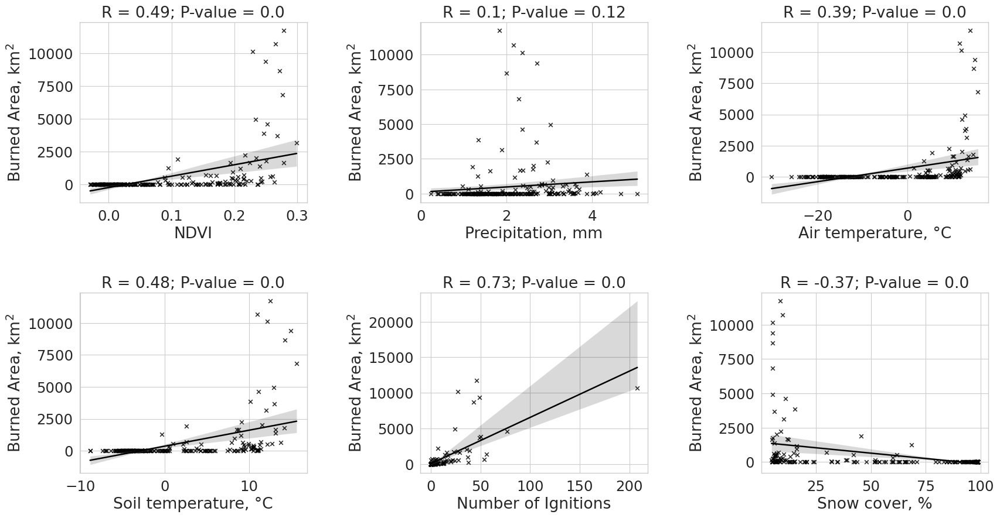

In [36]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Burnt area vs. NDVI
sns.regplot(x ='NDVI', y ='Burned Area, km$^2$', data = dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res_pearson[0],2)) + '; P-value = ' + str(round(res_pearson[1],2)));
# Burnt area vs. Precipitation
sns.regplot(x ='Precipitation, mm', y ='Burned Area, km$^2$', data = dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_1[0],2)) + '; P-value = ' + str(round(res_pearson_1[1],2)));
# Burnt area vs. Air temperature
sns.regplot(x ='Air temperature, °C', y ='Burned Area, km$^2$', data = dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_pearson_2[0],2)) + '; P-value = ' + str(round(res_pearson_2[1],2)));
# Burnt area vs. Soil temperature
sns.regplot(x ='Soil temperature, °C', y ='Burned Area, km$^2$', data = dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_pearson_3[0],2)) + '; P-value = ' + str(round(res_pearson_3[1],2)));
# Burnt area vs. Number of ignitions
sns.regplot(x ='Number of Ignitions', y ='Burned Area, km$^2$', data = dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_4[0],2)) + '; P-value = ' + str(round(res_pearson_4[1],2)));
# Burnt area vs. Snow cover
sns.regplot(x ='Snow cover, %', y ='Burned Area, km$^2$', data = dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_pearson_5[0],2)) + '; P-value = ' + str(round(res_pearson_5[1],2)));
# saving the figure
plt.savefig('regression_all_monthly_means_burnt_area.png', dpi=300, bbox_inches='tight')

**Regression analysis between the number of ignitions and other monthly mean characteristics**

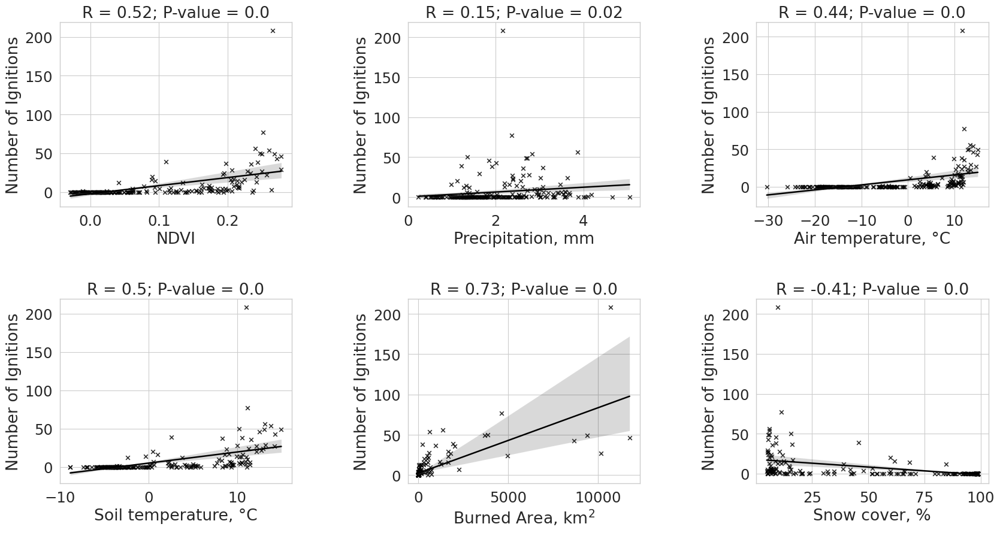

In [37]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Number of ignitions vs. NDVI
sns.regplot(x ='NDVI', y ='Number of Ignitions', data = dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(ign_res_pearson[0],2)) + '; P-value = ' + str(round(ign_res_pearson[1],2)));
# Number of ignitions vs. Precipitation
sns.regplot(x ='Precipitation, mm', y ='Number of Ignitions', data = dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(ign_res_pearson_1[0],2)) + '; P-value = ' + str(round(ign_res_pearson_1[1],2)));
# Number of ignitions vs. Air temperature
sns.regplot(x ='Air temperature, °C', y ='Number of Ignitions', data = dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(ign_res_pearson_2[0],2)) + '; P-value = ' + str(round(res_pearson_2[1],2)));
# Number of ignitions vs. Soil temperature
sns.regplot(x ='Soil temperature, °C', y ='Number of Ignitions', data = dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(ign_res_pearson_3[0],2)) + '; P-value = ' + str(round(res_pearson_3[1],2)));
# Number of ignitions vs. Burnt area
sns.regplot(x ='Burned Area, km$^2$', y ='Number of Ignitions', data = dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_4[0],2)) + '; P-value = ' + str(round(res_pearson_4[1],2)));
# Number of ignitions vs. Snow cover
sns.regplot(x ='Snow cover, %', y ='Number of Ignitions', data = dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(ign_res_pearson_4[0],2)) + '; P-value = ' + str(round(res_pearson_4[1],2)));
# saving the figure
plt.savefig('regression_all_monthly_means_nr_ign.png', dpi=300, bbox_inches='tight')

Since regression analysis didn't show any strong or even moderate correlation between characteristics (exept for 0.73 between two wildfire characteristics - burnt area and number of ignitions), in the next example the winter season (November-March) would be removed from the dataset as during this time mostly no wildfires or ignitions happen.

In [38]:
dataset


,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$"
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367,0.010267,0.0,0.0
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743,-0.029232,0.0,0.0
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327,-0.009433,0.0,0.0
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998,-0.008643,0.0,0.4
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462,0.025074,0.0,0.8
...,...,...,...,...,...,...,...,...
223,2019-08-01,10.457738,3.049905,10.537934,5.465585,0.226639,NaN,278.4
224,2019-09-01,5.896062,3.205314,5.995337,13.023705,0.153316,NaN,21.3
225,2019-10-01,-3.090928,3.122654,-0.028766,62.783615,0.068827,NaN,0.0
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520,0.023764,NaN,0.0


In [39]:
# preparing the data
# extracting the month from time column
dataset["Month"] = dataset["Time"].dt.month
# removing winter season month from the dataset
summer_means_dataset = dataset.drop(dataset[dataset['Month'] < 4].index)
summer_means_dataset = summer_means_dataset.drop(summer_means_dataset[summer_means_dataset['Month'] > 10].index)
summer_means_dataset

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$",Month
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998,-0.008643,0.0,0.4,4
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462,0.025074,0.0,0.8,5
5,2001-06-01,10.434820,1.401700,7.413628,24.116014,0.125091,1.0,0.0,6
6,2001-07-01,10.879753,3.438156,10.187267,8.915991,0.165041,5.0,157.2,7
7,2001-08-01,9.937401,2.985935,9.341869,6.304468,0.198173,2.0,2.8,8
...,...,...,...,...,...,...,...,...,...
221,2019-06-01,13.175156,1.893950,11.981738,10.475806,0.299246,NaN,3146.8,6
222,2019-07-01,15.766836,2.286793,15.623320,5.286115,0.276887,NaN,6818.1,7
223,2019-08-01,10.457738,3.049905,10.537934,5.465585,0.226639,NaN,278.4,8
224,2019-09-01,5.896062,3.205314,5.995337,13.023705,0.153316,NaN,21.3,9


**Regression analysis between burnt area and other summer monthly mean parameters**

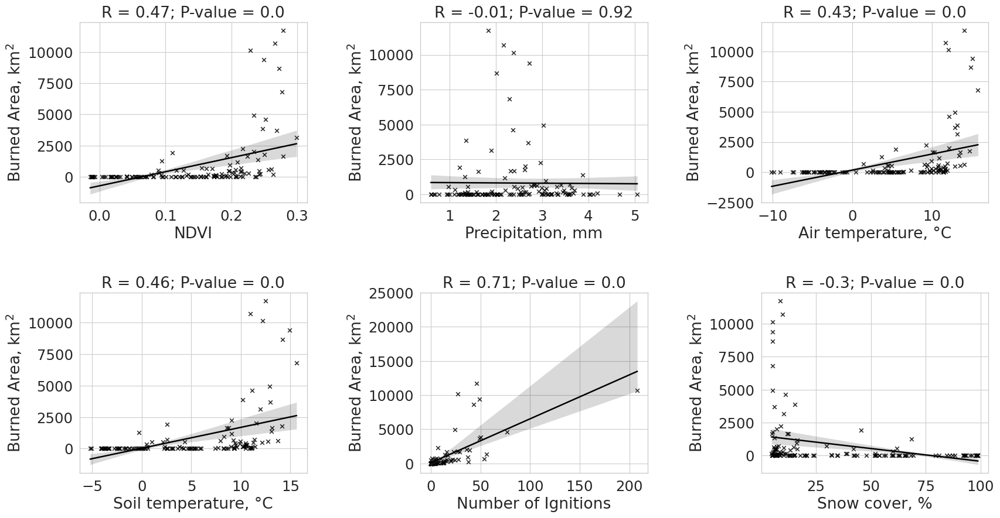

In [40]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Burnt area vs. NDVI
summer_subset = summer_means_dataset.dropna(subset=['NDVI', 'Burned Area, km$^2$'])
xs = summer_subset['NDVI']
ys = summer_subset['Burned Area, km$^2$']
res_pearson = stats.pearsonr(xs, ys)
sns.regplot(x ='NDVI', y ='Burned Area, km$^2$', data = summer_means_dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res_pearson[0],2)) + '; P-value = ' + str(round(res_pearson[1],2)));

# Burnt area vs. Precipitation
summer_subset_1 = summer_means_dataset.dropna(subset=['Precipitation, mm', 'Burned Area, km$^2$'])
xs_1 = summer_subset_1['Precipitation, mm']
ys_1 = summer_subset_1['Burned Area, km$^2$']
res_pearson_1 = stats.pearsonr(xs_1, ys_1)
sns.regplot(x ='Precipitation, mm', y ='Burned Area, km$^2$', data = summer_means_dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_1[0],2)) + '; P-value = ' + str(round(res_pearson_1[1],2)));

# Burnt area vs. Air temperature
summer_subset_2 = summer_means_dataset.dropna(subset=['Air temperature, °C', 'Burned Area, km$^2$'])
xs_2 = summer_subset_2['Air temperature, °C']
ys_2 = summer_subset_2['Burned Area, km$^2$']
res_pearson_2 = stats.pearsonr(xs_2, ys_2)
sns.regplot(x ='Air temperature, °C', y ='Burned Area, km$^2$', data = summer_means_dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_pearson_2[0],2)) + '; P-value = ' + str(round(res_pearson_2[1],2)));

# Burnt area vs. Soil temperature
summer_subset_3 = summer_means_dataset.dropna(subset=['Soil temperature, °C', 'Burned Area, km$^2$'])
xs_3 = summer_subset_3['Soil temperature, °C']
ys_3 = summer_subset_3['Burned Area, km$^2$']
res_pearson_3 = stats.pearsonr(xs_3, ys_3)
sns.regplot(x ='Soil temperature, °C', y ='Burned Area, km$^2$', data = summer_means_dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_pearson_3[0],2)) + '; P-value = ' + str(round(res_pearson_3[1],2)));

# Burnt area vs. Number of ignitions
summer_subset_4 = summer_means_dataset.dropna(subset=['Number of Ignitions', 'Burned Area, km$^2$'])
xs_4 = summer_subset_4['Number of Ignitions']
ys_4 = summer_subset_4['Burned Area, km$^2$']
res_pearson_4 = stats.pearsonr(xs_4, ys_4)
sns.regplot(x ='Number of Ignitions', y ='Burned Area, km$^2$', data = summer_means_dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_4[0],2)) + '; P-value = ' + str(round(res_pearson_4[1],2)));

# Burnt area vs. Snow cover
summer_subset_5 = summer_means_dataset.dropna(subset=['Snow cover, %', 'Burned Area, km$^2$'])
xs_5 = summer_subset_5['Snow cover, %']
ys_5 = summer_subset_5['Burned Area, km$^2$']
res_pearson_5 = stats.pearsonr(xs_5, ys_5)
sns.regplot(x ='Snow cover, %', y ='Burned Area, km$^2$', data = summer_means_dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_pearson_5[0],2)) + '; P-value = ' + str(round(res_pearson_5[1],2)));

# saving the figure
plt.savefig('regression_summer_monthly_means_burnt_area.png', dpi=300, bbox_inches='tight')

**Regression analysis between the number of ignitions and other summer monthly mean parameters**

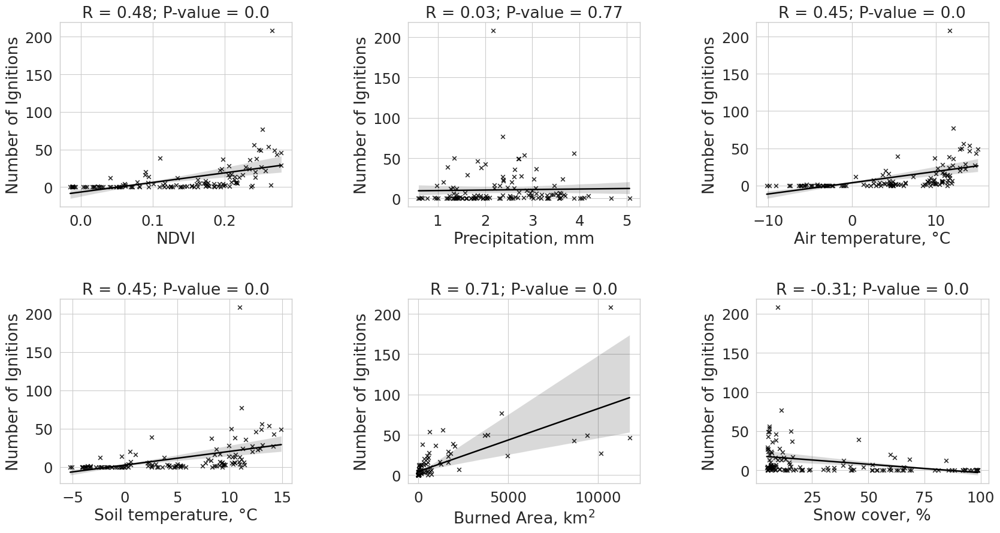

In [41]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Burnt area vs. NDVI
summer_subset_ign = summer_means_dataset.dropna(subset=['NDVI', 'Number of Ignitions'])
xs_ign = summer_subset_ign['NDVI']
ys_ign = summer_subset_ign['Number of Ignitions']
res_pearson_ign = stats.pearsonr(xs_ign, ys_ign)
sns.regplot(x ='NDVI', y ='Number of Ignitions', data = summer_means_dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res_pearson_ign[0],2)) + '; P-value = ' + str(round(res_pearson_ign[1],2)));

# Burnt area vs. Precipitation
summer_subset_ign_1 = summer_means_dataset.dropna(subset=['Precipitation, mm', 'Number of Ignitions'])
xs_ign_1 = summer_subset_ign_1['Precipitation, mm']
ys_ign_1 = summer_subset_ign_1['Number of Ignitions']
res_pearson_ign_1 = stats.pearsonr(xs_ign_1, ys_ign_1)
sns.regplot(x ='Precipitation, mm', y ='Number of Ignitions', data = summer_means_dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_ign_1[0],2)) + '; P-value = ' + str(round(res_pearson_ign_1[1],2)));

# Burnt area vs. Air temperature
summer_subset_ign_2 = summer_means_dataset.dropna(subset=['Air temperature, °C', 'Number of Ignitions'])
xs_ign_2 = summer_subset_ign_2['Air temperature, °C']
ys_ign_2 = summer_subset_ign_2['Number of Ignitions']
res_pearson_ign_2 = stats.pearsonr(xs_ign_2, ys_ign_2)
sns.regplot(x ='Air temperature, °C', y ='Number of Ignitions', data = summer_means_dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_pearson_ign_2[0],2)) + '; P-value = ' + str(round(res_pearson_ign_2[1],2)));

# Burnt area vs. Soil temperature
summer_subset_ign_3 = summer_means_dataset.dropna(subset=['Soil temperature, °C', 'Number of Ignitions'])
xs_ign_3 = summer_subset_ign['Soil temperature, °C']
ys_ign_3 = summer_subset_ign['Number of Ignitions']
res_pearson_ign_3 = stats.pearsonr(xs_ign_3, ys_ign_3)
sns.regplot(x ='Soil temperature, °C', y ='Number of Ignitions', data = summer_means_dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_pearson_ign_3[0],2)) + '; P-value = ' + str(round(res_pearson_ign_3[1],2)));

# Burnt area vs. Number of ignitions
summer_subset_ign_4 = summer_means_dataset.dropna(subset=['Number of Ignitions', 'Number of Ignitions'])
xs_ign_4 = summer_subset_ign_4['Burned Area, km$^2$']
ys_ign_4 = summer_subset_ign_4['Number of Ignitions']
res_pearson_ign_4 = stats.pearsonr(xs_ign_4, ys_ign_4)
sns.regplot(x ='Burned Area, km$^2$', y ='Number of Ignitions', data = summer_means_dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_pearson_ign_4[0],2)) + '; P-value = ' + str(round(res_pearson_ign_4[1],2)));

# Burnt area vs. Snow cover
summer_subset_ign_5 = summer_means_dataset.dropna(subset=['Snow cover, %', 'Number of Ignitions'])
xs_ign_5 = summer_subset_ign_5['Snow cover, %']
ys_ign_5 = summer_subset_ign_5['Number of Ignitions']
res_pearson_ign_5 = stats.pearsonr(xs_ign_5, ys_ign_5)
sns.regplot(x ='Snow cover, %', y ='Number of Ignitions', data = summer_means_dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_pearson_ign_5[0],2)) + '; P-value = ' + str(round(res_pearson_ign_5[1],2)));

# saving the figure
plt.savefig('regression_summer_monthly_means_nr_ign.png', dpi=300, bbox_inches='tight')

Monthly mean data correlations for the rest of the summer season (April-October) did not produce any strong or moderate correlations (exept for correlation 0.71 between the number of ignitions and burnt area). A third approach involved examining whether the winter season means had any impact on the summer means wildfire data. Specifically, the study investigated whether warm temperatures, short periods of snow cover, or lack of precipitation during the winter season affected summer wildfire data.

In [42]:
# Creating a new dataframe and including in it summer mean wildfire data
new_dataset = pd.DataFrame({'Years': [2001,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019],
                          'Number of Wildfires': [np.nan, np.nan, np.nan,405,342,300,298,274,875,1099,479,410,542,341,587,476,373,413,694],
                         'Number of Ignitions': [9, 72, 33, 123, 148, 22, 68, 26, 91, 91, 32, 25, 86, 21, 233, 74, 67, 59,np.nan],
                         'Burned Area, km$^2$': [162.3, 7787, 2369.2, 23489.5, 18454.0, 715.4, 1201.8, 335.1, 11112.9, 3184.9,
                                        755.9, 586.9, 4834.5, 616.1, 16466.8, 1605.6, 2089.7, 1507.0, 10489.3]})
new_dataset

,Years,Number of Wildfires,Number of Ignitions,"Burned Area, km$^2$"
0,2001,NaN,9.0,162.3
1,2002,NaN,72.0,7787.0
2,2003,NaN,33.0,2369.2
3,2004,405.0,123.0,23489.5
4,2005,342.0,148.0,18454.0
5,2006,300.0,22.0,715.4
6,2007,298.0,68.0,1201.8
7,2008,274.0,26.0,335.1
8,2009,875.0,91.0,11112.9
9,2010,1099.0,91.0,3184.9


In [43]:
# data preparetion
dataset["Year"] = dataset["Time"].dt.year
dataset

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$",Month,Year
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367,0.010267,0.0,0.0,1,2001
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743,-0.029232,0.0,0.0,2,2001
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327,-0.009433,0.0,0.0,3,2001
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998,-0.008643,0.0,0.4,4,2001
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462,0.025074,0.0,0.8,5,2001
...,...,...,...,...,...,...,...,...,...,...
223,2019-08-01,10.457738,3.049905,10.537934,5.465585,0.226639,NaN,278.4,8,2019
224,2019-09-01,5.896062,3.205314,5.995337,13.023705,0.153316,NaN,21.3,9,2019
225,2019-10-01,-3.090928,3.122654,-0.028766,62.783615,0.068827,NaN,0.0,10,2019
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520,0.023764,NaN,0.0,11,2019


In [44]:
print(dataset[(dataset['Month'] > 3) & (dataset['Month'] < 11)])

          Time  Air temperature, °C  Precipitation, mm  Soil temperature, °C  \
3   2001-04-01            -5.502991           1.777363             -3.781254   
4   2001-05-01            -0.667839           1.331464             -2.217439   
5   2001-06-01            10.434820           1.401700              7.413628   
6   2001-07-01            10.879753           3.438156             10.187267   
7   2001-08-01             9.937401           2.985935              9.341869   
..         ...                  ...                ...                   ...   
221 2019-06-01            13.175156           1.893950             11.981738   
222 2019-07-01            15.766836           2.286793             15.623320   
223 2019-08-01            10.457738           3.049905             10.537934   
224 2019-09-01             5.896062           3.205314              5.995337   
225 2019-10-01            -3.090928           3.122654             -0.028766   

     Snow cover, %      NDVI  Number of

In [45]:
dataset_winter_monthly_means = dataset.drop(dataset[(dataset['Month'] > 3) & (dataset['Month'] < 11)].index)

In [46]:
dataset_winter_monthly_means

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$",Month,Year
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367,0.010267,0.0,0.0,1,2001
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743,-0.029232,0.0,0.0,2,2001
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327,-0.009433,0.0,0.0,3,2001
10,2001-11-01,-17.293171,0.627288,-5.103772,94.466652,-0.002755,0.0,0.0,11,2001
11,2001-12-01,-22.517354,1.266994,-7.350577,97.740280,0.041791,0.0,0.0,12,2001
...,...,...,...,...,...,...,...,...,...,...
216,2019-01-01,-18.422331,1.370370,-3.309872,98.681046,0.010454,NaN,0.0,1,2019
217,2019-02-01,-12.837164,1.730536,-3.258925,98.711220,-0.016852,NaN,0.0,2,2019
218,2019-03-01,-5.780530,2.120857,-2.975914,98.434700,-0.003059,NaN,0.2,3,2019
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520,0.023764,NaN,0.0,11,2019


In [47]:
# Calculate mean values for the first year of the dataset separetaly as it has only 4 month January, February, March and April
Temp_2001 = dataset_winter_monthly_means.loc[(dataset_winter_monthly_means['Year'] == 2001) &
                                 (dataset_winter_monthly_means['Month'] < 5), 'Air temperature, °C'].mean()
print('Mean air temperature for winter 2001: ' + str(Temp_2001));

Precip_2001 = dataset_winter_monthly_means.loc[(dataset_winter_monthly_means['Year'] == 2001) &
                                 (dataset_winter_monthly_means['Month'] < 5), 'Precipitation, mm'].mean()
print(Precip_2001)

Soil_2001 = dataset_winter_monthly_means.loc[(dataset_winter_monthly_means['Year'] == 2001) &
                                 (dataset_winter_monthly_means['Month'] < 5), 'Soil temperature, °C'].mean()
print(Soil_2001)

Snow_2001 = dataset_winter_monthly_means.loc[(dataset_winter_monthly_means['Year'] == 2001) &
                                 (dataset_winter_monthly_means['Month'] < 5), 'Snow cover, %'].mean()
print(Snow_2001)

NDVI_2001 = dataset_winter_monthly_means.loc[(dataset_winter_monthly_means['Year'] == 2001) &
                                 (dataset_winter_monthly_means['Month'] < 5), 'NDVI'].mean()
print(NDVI_2001)

Mean air temperature for winter 2001: -13.948204112520585
1.8131351
-3.939852729574239
98.68414
-0.009465799231699733


In [48]:
# Remove separately calculated values from the dataset
dataset_winter_monthly_means = dataset_winter_monthly_means.drop(
    dataset_winter_monthly_means[(dataset_winter_monthly_means['Year'] == 2001) &
                                 (dataset_winter_monthly_means['Month'] < 5)].index)

# Remove 2019 winter values as they won't be used in that kind of analysis
dataset_winter_monthly_means = dataset_winter_monthly_means.drop(
    dataset_winter_monthly_means[(dataset_winter_monthly_means['Year'] == 2019) &
                                 (dataset_winter_monthly_means['Month'] > 5)].index)

In [49]:
dataset_winter_monthly_means

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$",Month,Year
10,2001-11-01,-17.293171,0.627288,-5.103772,94.466652,-0.002755,0.0,0.0,11,2001
11,2001-12-01,-22.517354,1.266994,-7.350577,97.740280,0.041791,0.0,0.0,12,2001
12,2002-01-01,-17.162096,2.125455,-5.337004,98.699799,0.010443,0.0,0.0,1,2002
13,2002-02-01,-17.405949,1.294994,-5.383830,98.765320,-0.027584,0.0,0.0,2,2002
14,2002-03-01,-12.492631,0.535985,-5.375622,98.777260,-0.011087,0.0,0.0,3,2002
...,...,...,...,...,...,...,...,...,...,...
214,2018-11-01,-10.957086,1.792023,-2.779824,90.467590,0.013421,0.0,0.0,11,2018
215,2018-12-01,-16.667802,2.262981,-2.633675,98.554848,0.034268,0.0,0.0,12,2018
216,2019-01-01,-18.422331,1.370370,-3.309872,98.681046,0.010454,NaN,0.0,1,2019
217,2019-02-01,-12.837164,1.730536,-3.258925,98.711220,-0.016852,NaN,0.0,2,2019


In [50]:
dataset_winter_means = dataset_winter_monthly_means.groupby(np.arange(len(dataset_winter_monthly_means))//5).mean()
dataset_winter_means

,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$",Month,Year
0,-17.374240,1.170143,-5.710161,97.689865,0.002162,0.0,0.00,5.8,2001.6
1,-13.761815,1.624074,-3.958210,94.647537,0.010345,0.0,0.06,5.8,2002.6
2,-18.129983,1.500853,-4.216084,95.871307,0.001977,0.0,0.00,5.8,2003.6
3,-15.738641,1.794644,-2.849714,98.580505,-0.006710,0.0,0.02,5.8,2004.6
4,-18.312144,1.454230,-4.456871,98.106461,0.003203,0.0,0.02,5.8,2005.6
5,-19.392826,0.933612,-5.294585,97.508652,0.007017,0.0,0.00,5.8,2006.6
6,-17.323785,1.502570,-4.582550,98.343323,0.011639,0.0,0.02,5.8,2007.6
7,-18.850940,1.485850,-4.394564,98.605927,0.008968,0.0,0.00,5.8,2008.6
8,-17.357056,1.180263,-5.406220,96.422974,0.019166,0.0,0.04,5.8,2009.6
9,-17.490234,1.392677,-4.161311,98.346848,0.002055,0.0,0.02,5.8,2010.6


In [51]:
# Extracting data from dataframe and assigning the first value for winter 2001
# Air temperature
temp_winter_means = dataset_winter_means['Air temperature, °C']
temp_winter_means.index = temp_winter_means.index +1
temp_winter_means = pd.concat([pd.Series([Temp_2001]), temp_winter_means])
# Precipitation
precip_winter_means = dataset_winter_means['Precipitation, mm']
precip_winter_means.index = precip_winter_means.index +1
precip_winter_means = pd.concat([pd.Series([Precip_2001]), precip_winter_means])
# Soil temperature
soil_winter_means = dataset_winter_means['Soil temperature, °C']
soil_winter_means.index = soil_winter_means.index +1
soil_winter_means = pd.concat([pd.Series([Soil_2001]), soil_winter_means])
# Snow cover
snow_winter_means = dataset_winter_means['Snow cover, %']
snow_winter_means.index = snow_winter_means.index +1
snow_winter_means = pd.concat([pd.Series([Snow_2001]), snow_winter_means])
# NDVI
ndvi_winter_means = dataset_winter_means['NDVI']
ndvi_winter_means.index = ndvi_winter_means.index +1
ndvi_winter_means = pd.concat([pd.Series([NDVI_2001]), ndvi_winter_means])

In [52]:
new_dataset['Air temperature, °C'] = temp_winter_means
new_dataset['Precipitation, mm'] = precip_winter_means
new_dataset['Soil temperature, °C'] = soil_winter_means
new_dataset['Snow cover, %'] = snow_winter_means
new_dataset['NDVI'] = ndvi_winter_means
new_dataset

,Years,Number of Wildfires,Number of Ignitions,"Burned Area, km$^2$","Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI
0,2001,NaN,9.0,162.3,-13.948204,1.813135,-3.939853,98.684143,-0.009466
1,2002,NaN,72.0,7787.0,-17.374240,1.170143,-5.710161,97.689865,0.002162
2,2003,NaN,33.0,2369.2,-13.761815,1.624074,-3.958210,94.647537,0.010345
3,2004,405.0,123.0,23489.5,-18.129983,1.500853,-4.216084,95.871307,0.001977
4,2005,342.0,148.0,18454.0,-15.738641,1.794644,-2.849714,98.580505,-0.006710
5,2006,300.0,22.0,715.4,-18.312144,1.454230,-4.456871,98.106461,0.003203
6,2007,298.0,68.0,1201.8,-19.392826,0.933612,-5.294585,97.508652,0.007017
7,2008,274.0,26.0,335.1,-17.323785,1.502570,-4.582550,98.343323,0.011639
8,2009,875.0,91.0,11112.9,-18.850940,1.485850,-4.394564,98.605927,0.008968
9,2010,1099.0,91.0,3184.9,-17.357056,1.180263,-5.406220,96.422974,0.019166



**Regression analysis between summer total burnt area and other winter mean parameters**



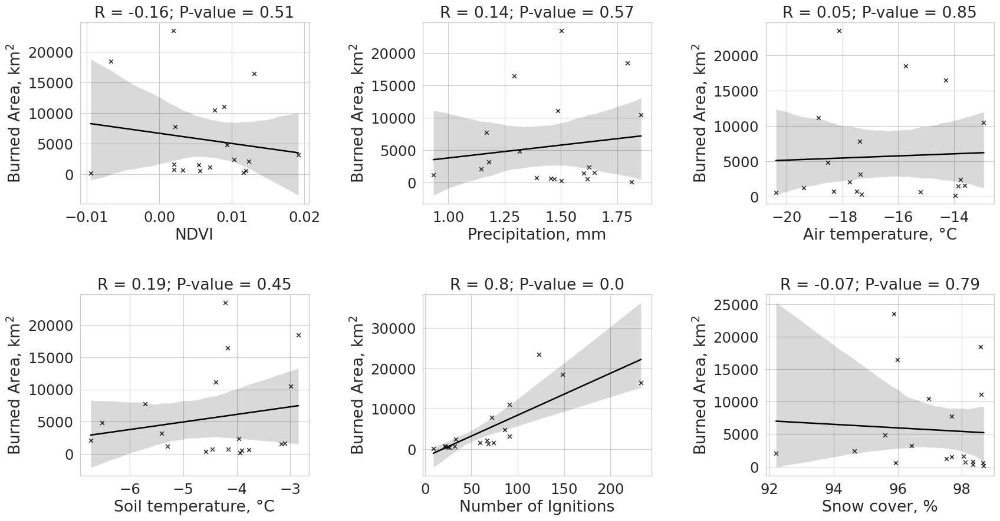

In [53]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Burnt area vs. NDVI
subset = new_dataset.dropna(subset=['NDVI', 'Burned Area, km$^2$'])
xs = subset['NDVI']
ys = subset['Burned Area, km$^2$']
res = stats.pearsonr(xs, ys)
sns.regplot(x ='NDVI', y ='Burned Area, km$^2$', data = new_dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res[0],2)) + '; P-value = ' + str(round(res[1],2)));
# Burned area vs. Precipitation
subset_1 = new_dataset.dropna(subset=['Precipitation, mm', 'Burned Area, km$^2$'])
xs_1 = subset_1['Precipitation, mm']
ys_1 = subset_1['Burned Area, km$^2$']
res_1 = stats.pearsonr(xs_1, ys_1)
sns.regplot(x ='Precipitation, mm', y ='Burned Area, km$^2$', data = new_dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_1[0],2)) + '; P-value = ' + str(round(res_1[1],2)));
# Burned area vs. Air temperature
subset_2 = new_dataset.dropna(subset=['Air temperature, °C', 'Burned Area, km$^2$'])
xs_2 = subset_2['Air temperature, °C']
ys_2 = subset_2['Burned Area, km$^2$']
res_2 = stats.pearsonr(xs_2, ys_2)
sns.regplot(x ='Air temperature, °C', y ='Burned Area, km$^2$', data = new_dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_2[0],2)) + '; P-value = ' + str(round(res_2[1],2)));
# Burned area vs. Soil temperature
subset_3 = new_dataset.dropna(subset=['Soil temperature, °C', 'Burned Area, km$^2$'])
xs_3 = subset_3['Soil temperature, °C']
ys_3 = subset_3['Burned Area, km$^2$']
res_3 = stats.pearsonr(xs_3, ys_3)
sns.regplot(x ='Soil temperature, °C', y ='Burned Area, km$^2$', data = new_dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_3[0],2)) + '; P-value = ' + str(round(res_3[1],2)));
# Burned area vs. Number of Ignitions
subset_4 = new_dataset.dropna(subset=['Number of Ignitions', 'Burned Area, km$^2$'])
xs_4 = subset_4['Number of Ignitions']
ys_4 = subset_4['Burned Area, km$^2$']
res_4 = stats.pearsonr(xs_4, ys_4)
sns.regplot(x ='Number of Ignitions', y ='Burned Area, km$^2$', data = new_dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_4[0],2)) + '; P-value = ' + str(round(res_4[1],2)));
# Burned area vs. Snow cover
subset_5 = new_dataset.dropna(subset=['Snow cover, %', 'Burned Area, km$^2$'])
xs_5 = subset_5['Snow cover, %']
ys_5 = subset_5['Burned Area, km$^2$']
res_5 = stats.pearsonr(xs_5, ys_5)
sns.regplot(x ='Snow cover, %', y ='Burned Area, km$^2$', data = new_dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_5[0],2)) + '; P-value = ' + str(round(res_5[1],2)));

**Regression analysis between summer total number of ignitions and other winter mean parameters**

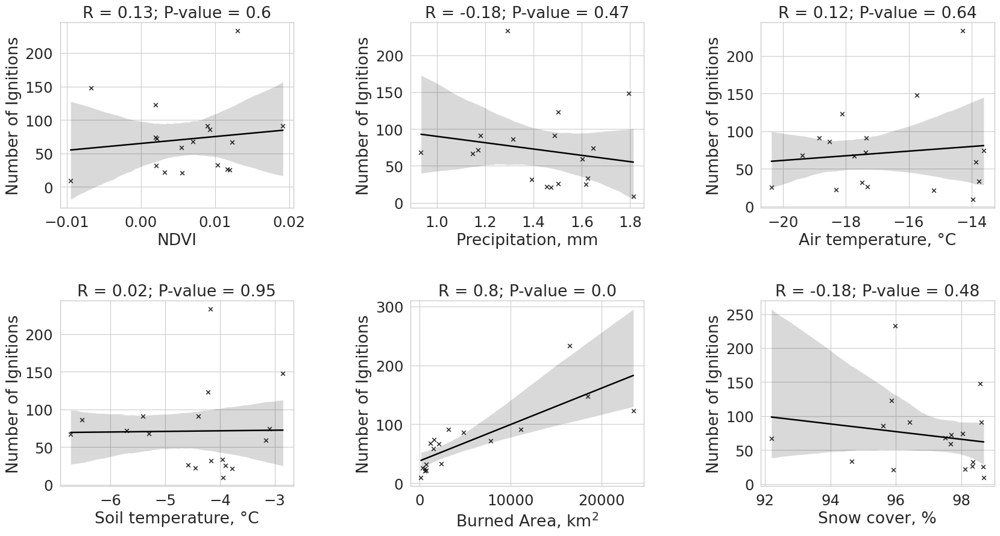

In [54]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Number of Ignitions vs. NDVI
subset = new_dataset.dropna(subset=['NDVI', 'Number of Ignitions'])
xs_ign = subset['NDVI']
ys_ign = subset['Number of Ignitions']
res_ign = stats.pearsonr(xs_ign, ys_ign)
sns.regplot(x ='NDVI', y ='Number of Ignitions', data = new_dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res_ign[0],2)) + '; P-value = ' + str(round(res_ign[1],2)));
# Number of Ignitions vs. Precipitation
subset_1 = new_dataset.dropna(subset=['Precipitation, mm', 'Number of Ignitions'])
xs_1_ign = subset_1['Precipitation, mm']
ys_1_ign = subset_1['Number of Ignitions']
res_1_ign = stats.pearsonr(xs_1_ign, ys_1_ign)
sns.regplot(x ='Precipitation, mm', y ='Number of Ignitions', data = new_dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_1_ign[0],2)) + '; P-value = ' + str(round(res_1_ign[1],2)));
# Number of Ignitions vs. Air temperature
subset_2 = new_dataset.dropna(subset=['Air temperature, °C', 'Number of Ignitions'])
xs_2_ign = subset_2['Air temperature, °C']
ys_2_ign = subset_2['Number of Ignitions']
res_2_ign = stats.pearsonr(xs_2_ign, ys_2_ign)
sns.regplot(x ='Air temperature, °C', y ='Number of Ignitions', data = new_dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_2_ign[0],2)) + '; P-value = ' + str(round(res_2_ign[1],2)));
# Number of Ignitions vs. Soil temperature
subset_3 = new_dataset.dropna(subset=['Soil temperature, °C', 'Number of Ignitions'])
xs_3_ign = subset_3['Soil temperature, °C']
ys_3_ign = subset_3['Number of Ignitions']
res_3_ign = stats.pearsonr(xs_3_ign, ys_3_ign)
sns.regplot(x ='Soil temperature, °C', y ='Number of Ignitions', data = new_dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_3_ign[0],2)) + '; P-value = ' + str(round(res_3_ign[1],2)));
# Number of Ignitions vs. Burned area
subset_4 = new_dataset.dropna(subset=['Number of Ignitions', 'Burned Area, km$^2$'])
xs_4_ign = subset_4['Number of Ignitions']
ys_4_ign = subset_4['Burned Area, km$^2$']
res_4_ign = stats.pearsonr(xs_4_ign, ys_4_ign)
sns.regplot(x ='Burned Area, km$^2$', y ='Number of Ignitions', data = new_dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_4_ign[0],2)) + '; P-value = ' + str(round(res_4_ign[1],2)));
# Number of Ignitions vs. Snow cover
subset_5 = new_dataset.dropna(subset=['Snow cover, %', 'Number of Ignitions'])
xs_5_ign = subset_5['Snow cover, %']
ys_5_ign = subset_5['Number of Ignitions']
res_5_ign = stats.pearsonr(xs_5_ign, ys_5_ign)
sns.regplot(x ='Snow cover, %', y ='Number of Ignitions', data = new_dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_5_ign[0],2)) + '; P-value = ' + str(round(res_5_ign[1],2)));

After examining whether the winter season means had any impact on the summer means wildfire data, a conclusion could be made that winter season means do not affect wildfire data in summer. The last approach would involve correlating summer mean climate variables and wildfire data.

In [55]:
# Exracting wildfire summer mean data from the previos dataframe
summer_mean_dataset = new_dataset.filter(['Years', 'Number of Wildfires', 'Number of Ignitions', 'Burned Area, km$^2$'])
summer_mean_dataset

,Years,Number of Wildfires,Number of Ignitions,"Burned Area, km$^2$"
0,2001,NaN,9.0,162.3
1,2002,NaN,72.0,7787.0
2,2003,NaN,33.0,2369.2
3,2004,405.0,123.0,23489.5
4,2005,342.0,148.0,18454.0
5,2006,300.0,22.0,715.4
6,2007,298.0,68.0,1201.8
7,2008,274.0,26.0,335.1
8,2009,875.0,91.0,11112.9
9,2010,1099.0,91.0,3184.9


In [56]:
dataset

,Time,"Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI,Number of Ignitions,"Burned Area, km$^2$",Month,Year
0,2001-01-01,-13.991748,2.429877,-3.626554,98.624367,0.010267,0.0,0.0,1,2001
1,2001-02-01,-13.424553,1.731383,-3.858328,98.717743,-0.029232,0.0,0.0,2,2001
2,2001-03-01,-14.428311,1.278146,-4.334677,98.710327,-0.009433,0.0,0.0,3,2001
3,2001-04-01,-5.502991,1.777363,-3.781254,98.447998,-0.008643,0.0,0.4,4,2001
4,2001-05-01,-0.667839,1.331464,-2.217439,85.715462,0.025074,0.0,0.8,5,2001
...,...,...,...,...,...,...,...,...,...,...
223,2019-08-01,10.457738,3.049905,10.537934,5.465585,0.226639,NaN,278.4,8,2019
224,2019-09-01,5.896062,3.205314,5.995337,13.023705,0.153316,NaN,21.3,9,2019
225,2019-10-01,-3.090928,3.122654,-0.028766,62.783615,0.068827,NaN,0.0,10,2019
226,2019-11-01,-11.699197,2.991520,-2.288151,90.248520,0.023764,NaN,0.0,11,2019


In [57]:
# Extracting summer monthly mean climate data
dataset_summer_monthly_means = dataset.drop(dataset[(dataset['Month'] < 6)].index)
dataset_summer_monthly_means = dataset_summer_monthly_means.drop(dataset_summer_monthly_means[(dataset_summer_monthly_means['Month'] > 8)].index)
dataset_summer_climate_means = dataset_summer_monthly_means.groupby(np.arange(len(dataset_summer_monthly_means))//3).mean()
# Addinig climate data to the dataframe
summer_mean_dataset['Air temperature, °C'] = dataset_summer_climate_means['Air temperature, °C']
summer_mean_dataset['Precipitation, mm'] = dataset_summer_climate_means['Precipitation, mm']
summer_mean_dataset['Soil temperature, °C'] = dataset_summer_climate_means['Soil temperature, °C']
summer_mean_dataset['Snow cover, %'] = dataset_summer_climate_means['Snow cover, %']
summer_mean_dataset['NDVI'] = dataset_summer_climate_means['NDVI']
summer_mean_dataset

,Years,Number of Wildfires,Number of Ignitions,"Burned Area, km$^2$","Air temperature, °C","Precipitation, mm","Soil temperature, °C","Snow cover, %",NDVI
0,2001,NaN,9.0,162.3,10.417324,2.608597,8.980921,13.112157,0.162768
1,2002,NaN,72.0,7787.0,10.465678,2.632855,9.726963,9.503097,0.225434
2,2003,NaN,33.0,2369.2,10.893802,3.162312,9.965236,10.189694,0.208429
3,2004,405.0,123.0,23489.5,14.208991,2.060381,13.521256,6.440504,0.268976
4,2005,342.0,148.0,18454.0,12.344885,2.480951,12.097982,7.488277,0.249994
5,2006,300.0,22.0,715.4,9.924758,3.326406,9.201065,9.618586,0.184594
6,2007,298.0,68.0,1201.8,12.540855,2.519610,11.870711,6.776354,0.248339
7,2008,274.0,26.0,335.1,9.782354,2.716969,9.032855,10.078862,0.204918
8,2009,875.0,91.0,11112.9,11.485932,2.461150,10.782063,7.914787,0.220952
9,2010,1099.0,91.0,3184.9,11.052275,3.107745,10.521109,7.494799,0.195589



**Regression analysis between summer total burnt area and other summer mean parameters**

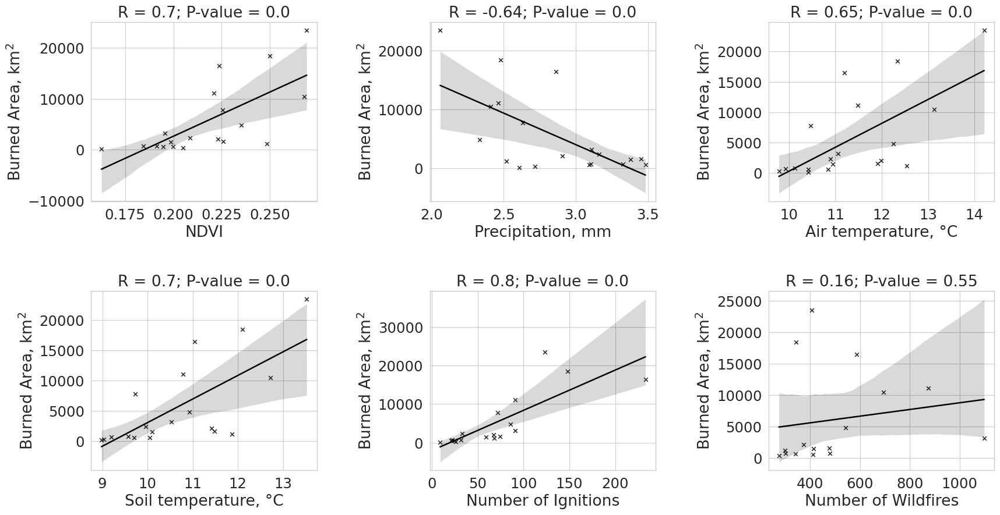

In [58]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Burnt area vs. NDVI
subset = summer_mean_dataset.dropna(subset=['NDVI', 'Burned Area, km$^2$'])
xs = subset['NDVI']
ys = subset['Burned Area, km$^2$']
res = stats.pearsonr(xs, ys)
sns.regplot(x ='NDVI', y ='Burned Area, km$^2$', data = summer_mean_dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res[0],2)) + '; P-value = ' + str(round(res[1],2)));
# Burned area vs. Precipitation
subset_1 = summer_mean_dataset.dropna(subset=['Precipitation, mm', 'Burned Area, km$^2$'])
xs_1 = subset_1['Precipitation, mm']
ys_1 = subset_1['Burned Area, km$^2$']
res_1 = stats.pearsonr(xs_1, ys_1)
sns.regplot(x ='Precipitation, mm', y ='Burned Area, km$^2$', data = summer_mean_dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_1[0],2)) + '; P-value = ' + str(round(res_1[1],2)));
# Burned area vs. Air temperature
subset_2 = summer_mean_dataset.dropna(subset=['Air temperature, °C', 'Burned Area, km$^2$'])
xs_2 = subset_2['Air temperature, °C']
ys_2 = subset_2['Burned Area, km$^2$']
res_2 = stats.pearsonr(xs_2, ys_2)
sns.regplot(x ='Air temperature, °C', y ='Burned Area, km$^2$', data = summer_mean_dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_2[0],2)) + '; P-value = ' + str(round(res_2[1],2)));
# Burned area vs. Soil temperature
subset_3 = summer_mean_dataset.dropna(subset=['Soil temperature, °C', 'Burned Area, km$^2$'])
xs_3 = subset_3['Soil temperature, °C']
ys_3 = subset_3['Burned Area, km$^2$']
res_3 = stats.pearsonr(xs_3, ys_3)
sns.regplot(x ='Soil temperature, °C', y ='Burned Area, km$^2$', data = summer_mean_dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_3[0],2)) + '; P-value = ' + str(round(res_3[1],2)));
# Burned area vs. Number of Ignitions
subset_4 = summer_mean_dataset.dropna(subset=['Number of Ignitions', 'Burned Area, km$^2$'])
xs_4 = subset_4['Number of Ignitions']
ys_4 = subset_4['Burned Area, km$^2$']
res_4 = stats.pearsonr(xs_4, ys_4)
sns.regplot(x ='Number of Ignitions', y ='Burned Area, km$^2$', data = summer_mean_dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_4[0],2)) + '; P-value = ' + str(round(res_4[1],2)));
# Burned area vs. Number of wilfires
subset_5 = summer_mean_dataset.dropna(subset=['Number of Wildfires', 'Burned Area, km$^2$'])
xs_5 = subset_5['Number of Wildfires']
ys_5 = subset_5['Burned Area, km$^2$']
res_5 = stats.pearsonr(xs_5, ys_5)
sns.regplot(x ='Number of Wildfires', y ='Burned Area, km$^2$', data = summer_mean_dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_5[0],2)) + '; P-value = ' + str(round(res_5[1],2)));

# saving the figure
plt.savefig('regression_summer_means_burnt_area.png', dpi=300, bbox_inches='tight')

**Regression analysis between summer total ammount of ignitions and other summer mean parameters**

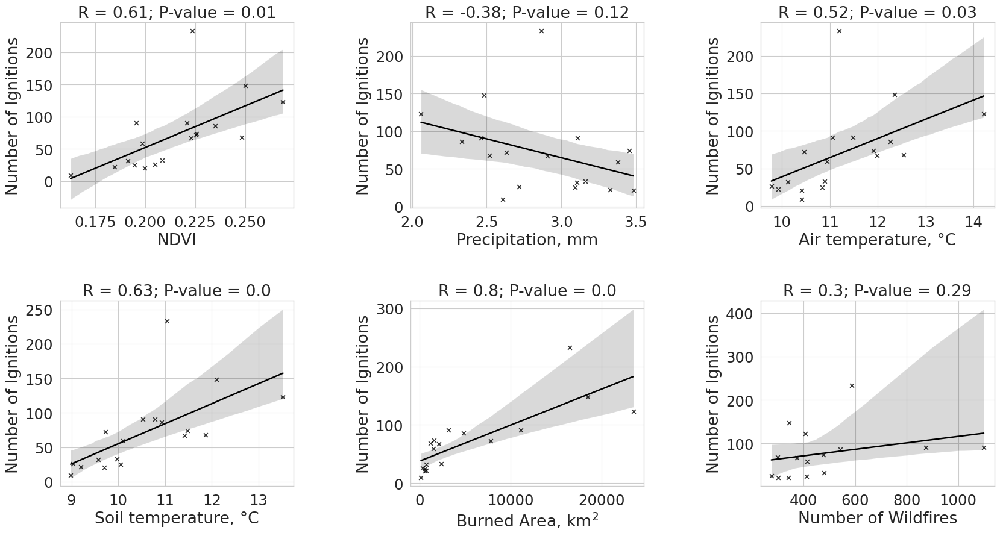

In [59]:
# plot
fig, axs = plt.subplots(nrows=2, ncols=3,figsize=(20, 10));
fig.subplots_adjust(hspace=0.5, wspace=0.5)
# Number of Ignitions vs. NDVI
subset = summer_mean_dataset.dropna(subset=['NDVI', 'Number of Ignitions'])
xs_ign = subset['NDVI']
ys_ign = subset['Number of Ignitions']
res_ign = stats.pearsonr(xs_ign, ys_ign)
sns.regplot(x ='NDVI', y ='Number of Ignitions', data = summer_mean_dataset,
            ax=axs[0, 0], color='k', marker='x').set(title='R = ' + str(round(res_ign[0],2)) + '; P-value = ' + str(round(res_ign[1],2)));
# Number of Ignitions vs. Precipitation
subset_1 = summer_mean_dataset.dropna(subset=['Precipitation, mm', 'Number of Ignitions'])
xs_1_ign = subset_1['Precipitation, mm']
ys_1_ign = subset_1['Number of Ignitions']
res_1_ign = stats.pearsonr(xs_1_ign, ys_1_ign)
sns.regplot(x ='Precipitation, mm', y ='Number of Ignitions', data = summer_mean_dataset,
            ax=axs[0, 1], color='k',marker='x').set(title='R = ' + str(round(res_1_ign[0],2)) + '; P-value = ' + str(round(res_1_ign[1],2)));
# Number of Ignitions vs. Air temperature
subset_2 = summer_mean_dataset.dropna(subset=['Air temperature, °C', 'Number of Ignitions'])
xs_2_ign = subset_2['Air temperature, °C']
ys_2_ign = subset_2['Number of Ignitions']
res_2_ign = stats.pearsonr(xs_2_ign, ys_2_ign)
sns.regplot(x ='Air temperature, °C', y ='Number of Ignitions', data = summer_mean_dataset,
            ax=axs[0, 2], color='k',marker='x').set(title='R = ' + str(round(res_2_ign[0],2)) + '; P-value = ' + str(round(res_2_ign[1],2)));
# Number of Ignitions vs. Soil temperature
subset_3 = summer_mean_dataset.dropna(subset=['Soil temperature, °C', 'Number of Ignitions'])
xs_3_ign = subset_3['Soil temperature, °C']
ys_3_ign = subset_3['Number of Ignitions']
res_3_ign = stats.pearsonr(xs_3_ign, ys_3_ign)
sns.regplot(x ='Soil temperature, °C', y ='Number of Ignitions', data = summer_mean_dataset,
            ax=axs[1, 0], color='k',marker='x').set(title='R = ' + str(round(res_3_ign[0],2)) + '; P-value = ' + str(round(res_3_ign[1],2)));
# Number of Ignitions vs. Burned area
subset_4 = summer_mean_dataset.dropna(subset=['Number of Ignitions', 'Burned Area, km$^2$'])
xs_4_ign = subset_4['Number of Ignitions']
ys_4_ign = subset_4['Burned Area, km$^2$']
res_4_ign = stats.pearsonr(xs_4_ign, ys_4_ign)
sns.regplot(x ='Burned Area, km$^2$', y ='Number of Ignitions', data = summer_mean_dataset,
            ax=axs[1, 1], color='k',marker='x').set(title='R = ' + str(round(res_4_ign[0],2)) + '; P-value = ' + str(round(res_4_ign[1],2)));
# Number of Ignitions vs. Number of Wildfires
subset_5 = summer_mean_dataset.dropna(subset=['Number of Wildfires', 'Number of Ignitions'])
xs_5_ign = subset_5['Number of Wildfires']
ys_5_ign = subset_5['Number of Ignitions']
res_5_ign = stats.pearsonr(xs_5_ign, ys_5_ign)
sns.regplot(x ='Number of Wildfires', y ='Number of Ignitions', data = summer_mean_dataset,
            ax=axs[1, 2], color='k',marker='x').set(title='R = ' + str(round(res_5_ign[0],2)) + '; P-value = ' + str(round(res_5_ign[1],2)));

# saving the figure
plt.savefig('regression_summer_means_nr_igns.png', dpi=300, bbox_inches='tight')

The Pearson regression coefficients for NDVI and soil temperature are
both 0.7, indicating a positive correlation between burnt area and these characteristics. The correlation coefficients for air temperature (0.65) and precipitation (-0.64) also suggest the presence of a positive and negative correlation, respectively. The wildfire characteristics show a strong correlation observed for the number of ignitions but no correlation for the number of wildfires.

The results of the regression analysis between the number of ignitions and several other characteristics indicate that there is only
a correlation between NDVI (0.61) and soil temperature (0.63) among the various
climate characteristics examined. Furthermore, the regression analysis revealed no correlation between the number of ignitions and wildfires reported in ANFIRS.

### Cross-correlation analysis

**Cross-correlation analysis between the burnt area and other monthly mean characteristics**

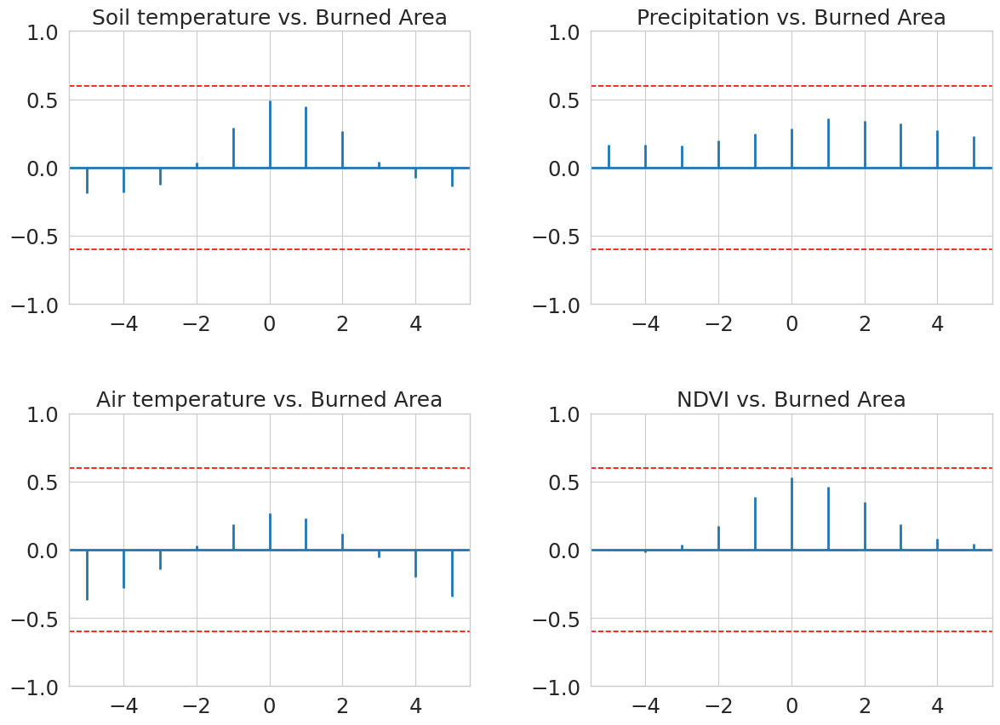

In [60]:
# plot
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.3)

# Burnt Area vs. Soil temperature
axs[0, 0].xcorr(dataset['Soil temperature, °C'], dataset['Burned Area, km$^2$'], usevlines=True, maxlags=5, normed=True, lw=2)
axs[0, 0].grid(True)
axs[0, 0].set_ylim(-1,1)
axs[0, 0].axhline(0.6, color = 'r', ls = "--")
axs[0, 0].axhline(-0.6, color = 'r', ls = "--")
axs[0, 0].set_title('Soil temperature vs. Burned Area', fontsize=18)

# Burnt Area vs. Precipitation
axs[0, 1].xcorr(dataset['Precipitation, mm'], dataset['Burned Area, km$^2$'], usevlines=True, maxlags=5, normed=True, lw=2)
axs[0, 1].grid(True)
axs[0, 1].set_ylim(-1,1)
axs[0, 1].axhline(0.6, color = 'r', ls = "--")
axs[0, 1].axhline(-0.6, color = 'r', ls = "--")
axs[0, 1].set_title('Precipitation vs. Burned Area', fontsize=18)

# Burnt Area vs. Air temperature
axs[1, 0].xcorr(dataset['Air temperature, °C'], dataset['Burned Area, km$^2$'], usevlines=True, maxlags=5, normed=True, lw=2)
axs[1, 0].grid(True)
axs[1, 0].set_ylim(-1,1)
axs[1, 0].axhline(0.6, color = 'r', ls = "--")
axs[1, 0].axhline(-0.6, color = 'r', ls = "--")
axs[1, 0].set_title('Air temperature vs. Burned Area', fontsize=18)

# Burnt Area vs. NDVI
axs[1, 1].xcorr(dataset['NDVI'], dataset['Burned Area, km$^2$'], usevlines=True, maxlags=5, normed=True, lw=2)
axs[1, 1].grid(True)
axs[1, 1].set_ylim(-1,1)
axs[1, 1].axhline(0.6, color = 'r', ls = "--")
axs[1, 1].axhline(-0.6, color = 'r', ls = "--")
axs[1, 1].set_title('NDVI vs. Burned Area', fontsize=18);

# Saving a figure
plt.savefig('Cross-correlation_brned_area.png', dpi=300, bbox_inches='tight')

**Cross-correlation analysis between the number of ignitions and other monthly mean characteristics**

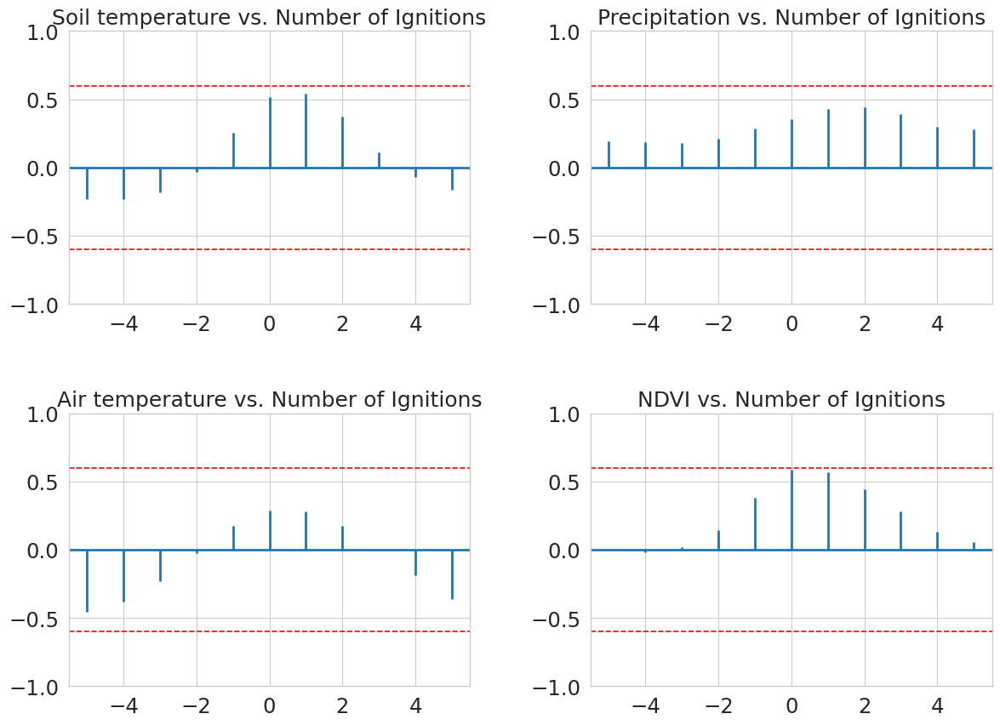

In [61]:
# plot
fig, axs = plt.subplots(2, 2, figsize=(14, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.3)

# Number of ignitions vs. Soil temperature
axs[0, 0].xcorr(dataset['Soil temperature, °C'][0:215], dataset['Number of Ignitions'][0:215], usevlines=True, maxlags=5, normed=True, lw=2)
axs[0, 0].grid(True)
axs[0, 0].set_ylim(-1,1)
axs[0, 0].axhline(0.6, color = 'r', ls = "--")
axs[0, 0].axhline(-0.6, color = 'r', ls = "--")
axs[0, 0].set_title('Soil temperature vs. Number of Ignitions', fontsize=18)

# Number of ignitions vs. Precipitation
axs[0, 1].xcorr(dataset['Precipitation, mm'][0:215], dataset['Number of Ignitions'][0:215], usevlines=True, maxlags=5, normed=True, lw=2)
axs[0, 1].grid(True)
axs[0, 1].set_ylim(-1,1)
axs[0, 1].axhline(0.6, color = 'r', ls = "--")
axs[0, 1].axhline(-0.6, color = 'r', ls = "--")
axs[0, 1].set_title('Precipitation vs. Number of Ignitions', fontsize=18)

# Number of ignitions vs. Air temperature
axs[1, 0].xcorr(dataset['Air temperature, °C'][0:215], dataset['Number of Ignitions'][0:215], usevlines=True, maxlags=5, normed=True, lw=2)
axs[1, 0].grid(True)
axs[1, 0].set_ylim(-1,1)
axs[1, 0].axhline(0.6, color = 'r', ls = "--")
axs[1, 0].axhline(-0.6, color = 'r', ls = "--")
axs[1, 0].set_title('Air temperature vs. Number of Ignitions', fontsize=18)

# Number of ignitions vs. NDVI
axs[1, 1].xcorr(dataset['NDVI'][0:215], dataset['Number of Ignitions'][0:215], usevlines=True, maxlags=5, normed=True, lw=2)
axs[1, 1].grid(True)
axs[1, 1].set_ylim(-1,1)
axs[1, 1].axhline(0.6, color = 'r', ls = "--")
axs[1, 1].axhline(-0.6, color = 'r', ls = "--")
axs[1, 1].set_title('NDVI vs. Number of Ignitions', fontsize=18);

# Saving a figure
plt.savefig('Cross-correlation_nr_ign.png', dpi=300, bbox_inches='tight')

The results of the cross-correlation analysis indicate that certain climate variables,
such as soil temperature and NDVI, can correlate with the occurrence of wildfire
events. However, no strong or moderate positive/negative correlation was observed,
with all correlations below 0.6.

# Machine learning methods

## UNet model

### Loading data for the model

In this project, all of the data was preprocessed and labeled manually. Sixteen satellite images capturing wildfire burn scars were obtained through Sentinel Hub. Using QGIS, all images were divided into tiles of 416×416 pixels each to make them suitable for input into a machine-learning model. Therefore, the dataset was expanded to include a total of 75 images Each image used in the study includes six frequency bands, organized as follows:

**Band 1: Blue** (Sentinel-2: Band 2)

**Band 2: Green** (Sentinel-2: Band 3)

**Band 3: Red** (Sentinel-2: Band 4)

**Band 4: NIR** (Sentinel-2: Band 8)

**Band 5: NDVI** (Sentinel-2: (Band 8 - Band 4)/(Band 8 + Band 4))

**Band 6: NDMI** (Sentinel-2: (Band 8A - Band 11)/(Band 8A + Band 11))

And masks for them with one band where areas with fire equals to 1 and the rest of the area is 0. Masks were created from ABoVE dataset (https://daac.ornl.gov/ABOVE/guides/Burned_Area_Depth_AK_CA.html) and adjusted manually in QGIS to fit the resolution of Sentinel-2 image and match burnt area.


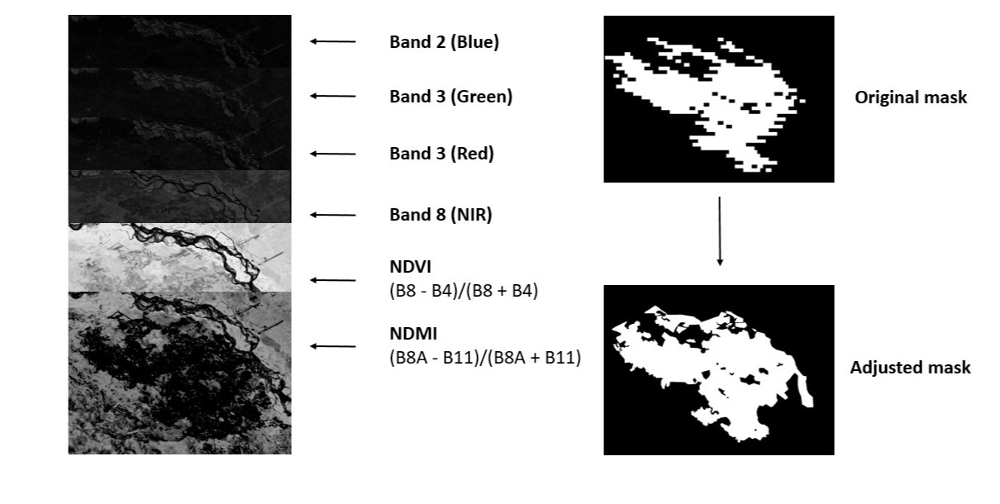

In [62]:
Image(filename='/content/drive/MyDrive/Thesis/Pics/Bands.jpg')

The dataset is divided into three parts, namely training, validation, and testing. The images and masks designated for the testing phase are kept separate from the rest of the dataset to ensure they do not influence the training or validation process. This separation also facilitates an unbiased comparison between the built model and the pre-trained model. The remaining 68 image-mask pairs are combined and randomly split into training and validation sets using a custom random-split function with a split ratio of 70:30, which allows the splitting of the dataset randomly every time before the training.

In [63]:
# Uploading images and masks for training and validation
paths_to_images = sorted(glob("/content/drive/MyDrive/Thesis/Images_for_random/*.tif"))
paths_to_masks = sorted(glob("/content/drive/MyDrive/Thesis/Masks_for_random/*.tif"))
print(f'Number of training images: {len(paths_to_images)}')
print(f'Number of training masks: {len(paths_to_masks)}')

Number of training images: 68
Number of training masks: 68


In [64]:
# Creating a dataset
class Alaska_Dataset(Dataset):
    """Constructs dataset of Alaska wilfire burn scars and their labelling masks.

    The class construction reads in image-and-mask pairs from the given paths
    and preprocessing if they are specified.

    Parameters
    ----------
    img_paths : list of str
        List of directory paths leading to each of the data images (must be
        readable by the `rasterio` module). The order must correspond to those
        given in `msk_paths` such that each image corresponds to its mask.
    msk_paths : list of str
        List of directory paths leading to each of the data masks (must be
        readable by the `rasterio` module). The order must correspond to those
        given in `img_paths` such that each image corresponds to its mask.
    augmentations : instance of the albumentation.Compose class
        Data augmentation pipeline that transform images (e.g. flip, transpose,
        rotate, crop, distort, brightness, contrast), composed with the
        Albumentation library.
    preprocessing : instance of the albumentation.Compose class
        Data preprocessing pipeline that transform images (e.g. normalise, type-
        convert), composed with the Albumentation library via the use of
        `albumentation.Lambda` method.
    """

    def __init__(self, images_path, masks_path):
        self.images_path = images_path
        self.masks_path = masks_path
        self.n_samples = len(images_path)

    def __getitem__(self, index):

        with rasterio.open(self.images_path[index], 'r') as img_src, rasterio.open(self.masks_path[index]) as msk_src:
            # images
            image = reshape_as_image(img_src.read())
            image = np.transpose(image, (2, 0, 1))  ## (6, 416, 416)
            image = image.astype(np.float32)
            image = torch.from_numpy(image)

            # masks
            mask = reshape_as_image(msk_src.read())
            mask = np.expand_dims(mask, axis=0) ## (1, 416, 416)
            mask = mask.astype(np.float32)
            mask = torch.from_numpy(mask)

        return image, mask

    def __len__(self):
        return self.n_samples

training_dataset = Alaska_Dataset(paths_to_images, paths_to_masks)

In [65]:
# Custom random-split function
def random_data_split(dataset, split_fractions=(0.7, 0.3)):
    """Split dataset into training and validation sets.

    Parameters
    ----------
    dataset : torch.utils.data.Dataset (or its subclass) instance
        The dataset to be split.
    split_fractions : list or tuple of floats
        The fraction (1 is the complete dataset) to split into training and
        validation datasets. The default is (0.7, 0.3).

    Returns
    -------
    list of torch.utils.data.Subset instances
        `[train_set, valid_set]`.

    """
    dataset_size = len(dataset)
    print(f"Available data size:      {dataset_size:7d}\n")

    # List of datasets (to be populated)
    setlist = []

    train_size = int(dataset_size * split_fractions[0])
    valid_size = dataset_size - train_size
    trainvalid_set = dataset

    # Split the full dataset into training and validation sets
    train_set, valid_set = random_split(trainvalid_set, [train_size, valid_size])

    # Prepend the training and validation sets to the set list
    setlist.insert(0, valid_set)
    setlist.insert(0, train_set)

    print("Split into:")
    print(f"Training set size:        {len(train_set):7d}")
    print(f"Validation set size:      {len(valid_set):7d}")
    print("---------------------------------")
    print(f"Total (for verification): {len(train_set) + len(valid_set):7d}\n")

    return setlist

In [66]:
# Split images and masks for training and validation datasets
train_set, valid_set = random_data_split(training_dataset, (0.7, 0.3))

Available data size:           68

Split into:
Training set size:             47
Validation set size:           21
---------------------------------
Total (for verification):      68



### Building the UNet model

The UNet model was chosen as it was previously used successfully for similar tasks in Ronneberger et al. (2015). The model was adapted to fit the six-band input images of wildfire burn scars and a one-band mask. The model is built to maintain the same image size between each max pooling and up-convolution with input and output sizes of 416×416 pixels, and 208×208, 104×104, 52×52, and 26×26 pixels at the bottleneck of the architecture. The final convolutional layer maps each 64-component feature vector to the two classes, where one represents wildfire burn scars, and zero represents the rest of the scene. The total amount of 23 convolutional layers remains in this UNet architecture.

In [67]:
# Convolutional block: the repeated application of two 3×3 convolutions with padding
# followed by batch normalization layers (BatchNorm2d), and rectified linear unit (ReLU) in the end
class conv_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv1 = nn.Conv2d(in_c, out_c, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(out_c)

        self.conv2 = nn.Conv2d(out_c, out_c, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(out_c)

        self.relu = nn.ReLU()

    def forward(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)

        x = self.conv2(x)
        x = self.bn2(x)
        x = self.relu(x)

        return x

# Encoder block: previously created convolutional block is followed by 2×2 max
# pooling operation with a stride of two is applied to downsample the feature map
class encoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.conv = conv_block(in_c, out_c)
        self.pool = nn.MaxPool2d((2, 2))

    def forward(self, inputs):
        x = self.conv(inputs)
        p = self.pool(x)

        return x, p

# Decoder block: the expansive path consists of an upsampling of the feature
# map, followed by a 2×2 convolution that halves the number of feature channels and
# concatenation with the corresponding feature map from the contracting path.
class decoder_block(nn.Module):
    def __init__(self, in_c, out_c):
        super().__init__()

        self.up = nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2, padding=0)
        self.conv = conv_block(out_c+out_c, out_c)

    def forward(self, inputs, skip):
        x = self.up(inputs)
        x = torch.cat([x, skip], axis=1)
        x = self.conv(x)
        return x

# Building a model
class build_unet(nn.Module):
    def __init__(self):
        super().__init__()

        """ Encoder """
        self.e1 = encoder_block(6, 64) # for 6 input channels
        self.e2 = encoder_block(64, 128)
        self.e3 = encoder_block(128, 256)
        self.e4 = encoder_block(256, 512)

        """ Bottleneck """
        self.b = conv_block(512, 1024)

        """ Decoder """
        self.d1 = decoder_block(1024, 512)
        self.d2 = decoder_block(512, 256)
        self.d3 = decoder_block(256, 128)
        self.d4 = decoder_block(128, 64)

        """ Classifier """
        self.outputs = nn.Conv2d(64, 1, kernel_size=1, padding=0) # 1 for binary segmentation

    def forward(self, inputs):
        """ Encoder """
        s1, p1 = self.e1(inputs)
        s2, p2 = self.e2(p1)
        s3, p3 = self.e3(p2)
        s4, p4 = self.e4(p3)

        """ Bottleneck """
        b = self.b(p4)

        """ Decoder """
        d1 = self.d1(b, s4)
        d2 = self.d2(d1, s3)
        d3 = self.d3(d2, s2)
        d4 = self.d4(d3, s1)

        outputs = self.outputs(d4)

        return outputs

# Checking if model works correct, the output must be [2, 1, 416, 416]
if __name__ == "__main__":
    x = torch.randn((2, 6, 416, 416))
    f = build_unet()
    y = f(x)
    print(y.shape)

torch.Size([2, 1, 416, 416])


In [68]:
# Print the architecture of the model
model = build_unet()
print(model)

build_unet(
  (e1): encoder_block(
    (conv): conv_block(
      (conv1): Conv2d(6, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (pool): MaxPool2d(kernel_size=(2, 2), stride=(2, 2), padding=0, dilation=1, ceil_mode=False)
  )
  (e2): encoder_block(
    (conv): conv_block(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
      (bn2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU()
    )
    (pool): MaxPool2d(kernel_size=(2, 2

In [69]:
# Creating a custom Dice loss function for model's evaluation
class DiceLoss(nn.Module):
    def __init__(self, weight=None, size_average=True):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):

        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)

        intersection = (inputs * targets).sum()
        dice = (2.*intersection + smooth)/(inputs.sum() + targets.sum() + smooth)

        return 1 - dice

In [70]:
# A function for creating an empty directory
def create_dir(path):
    if not os.path.exists(path):
        os.makedirs(path)

# A function to calculate the time taken
def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

### Training the UNet model

In [71]:
# Creating a function for training a model
def train(model, loader, optimizer, loss_fn, device):
    epoch_loss = 0.0
    model.train()

    for x, y in loader:
        x = x.to(device, dtype=torch.float32)
        y = y.to(device, dtype=torch.float32)

        optimizer.zero_grad()
        y_pred = model(x)
        loss = loss_fn(y_pred, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    epoch_loss = epoch_loss/len(loader)
    return epoch_loss

# Creating a function for model's evaluation
def evaluate(model, loader, loss_fn, device):
    epoch_loss = 0.0

    model.eval()
    with torch.no_grad():
        for x, y in loader:
            x = x.to(device, dtype=torch.float32)
            y = y.to(device, dtype=torch.float32)
            y_pred = model(x)
            loss = loss_fn(y_pred, y)
            epoch_loss += loss.item()

        epoch_loss = epoch_loss/len(loader)
    return epoch_loss

if __name__ == "__main__":

    """ Directories """
    create_dir("files")

    """ Hyperparameters """
    H = 416
    W = 416
    size = (H, W)
    batch_size = 2
    num_epochs = 40
    lr = 1e-4
    checkpoint_path = "files/checkpoint.pth"

    """ Dataset and loader """
    train_dataset = train_set
    valid_dataset = valid_set

    train_loader = DataLoader(
        dataset=train_dataset,
        batch_size=batch_size,
        shuffle=True
    )

    valid_loader = DataLoader(
        dataset=valid_dataset,
        batch_size=batch_size,
        shuffle=False
    )

    device = torch.device('cuda') if torch.cuda.is_available() else "cpu"
    model = build_unet()
    model = model.to(device)

    optimizer = torch.optim.Adam(model.parameters(), lr=lr)
    scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, 'min', patience=5, verbose=True)
    loss_fn = DiceLoss()

    """ Empty boxes to store losses """
    training_loss = []
    validation_loss = []

    """ Training the model """
    best_valid_loss = float("inf")

    for epoch in range(num_epochs):
        start_time = time.time()

        train_loss = train(model, train_loader, optimizer, loss_fn, device)
        valid_loss = evaluate(model, valid_loader, loss_fn, device)

        """ Saving the best model's result """
        if valid_loss < best_valid_loss:
            data_str = f"Valid loss improved from {best_valid_loss:2.4f} to {valid_loss:2.4f}. Saving checkpoint: {checkpoint_path}"
            print(data_str)

            best_valid_loss = valid_loss
            torch.save(model.state_dict(), checkpoint_path)

        """ Appending losses """
        training_loss.append(train_loss)
        validation_loss.append(valid_loss)

        end_time = time.time()
        epoch_mins, epoch_secs = epoch_time(start_time, end_time)

        data_str = f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s\n'
        data_str += f'\tTrain Loss: {train_loss:.3f}\n'
        data_str += f'\t Val. Loss: {valid_loss:.3f}\n'
        print(data_str)

Valid loss improved from inf to 0.4285. Saving checkpoint: files/checkpoint.pth
Epoch: 01 | Epoch Time: 1m 33s
	Train Loss: 0.392
	 Val. Loss: 0.429

Valid loss improved from 0.4285 to 0.2875. Saving checkpoint: files/checkpoint.pth
Epoch: 02 | Epoch Time: 0m 10s
	Train Loss: 0.260
	 Val. Loss: 0.287

Valid loss improved from 0.2875 to 0.2820. Saving checkpoint: files/checkpoint.pth
Epoch: 03 | Epoch Time: 0m 10s
	Train Loss: 0.257
	 Val. Loss: 0.282

Valid loss improved from 0.2820 to 0.2600. Saving checkpoint: files/checkpoint.pth
Epoch: 04 | Epoch Time: 0m 10s
	Train Loss: 0.219
	 Val. Loss: 0.260

Valid loss improved from 0.2600 to 0.2542. Saving checkpoint: files/checkpoint.pth
Epoch: 05 | Epoch Time: 0m 11s
	Train Loss: 0.225
	 Val. Loss: 0.254

Valid loss improved from 0.2542 to 0.1885. Saving checkpoint: files/checkpoint.pth
Epoch: 06 | Epoch Time: 0m 11s
	Train Loss: 0.223
	 Val. Loss: 0.188

Epoch: 07 | Epoch Time: 0m 11s
	Train Loss: 0.192
	 Val. Loss: 0.284

Epoch: 08 | Epo

### Loss functions

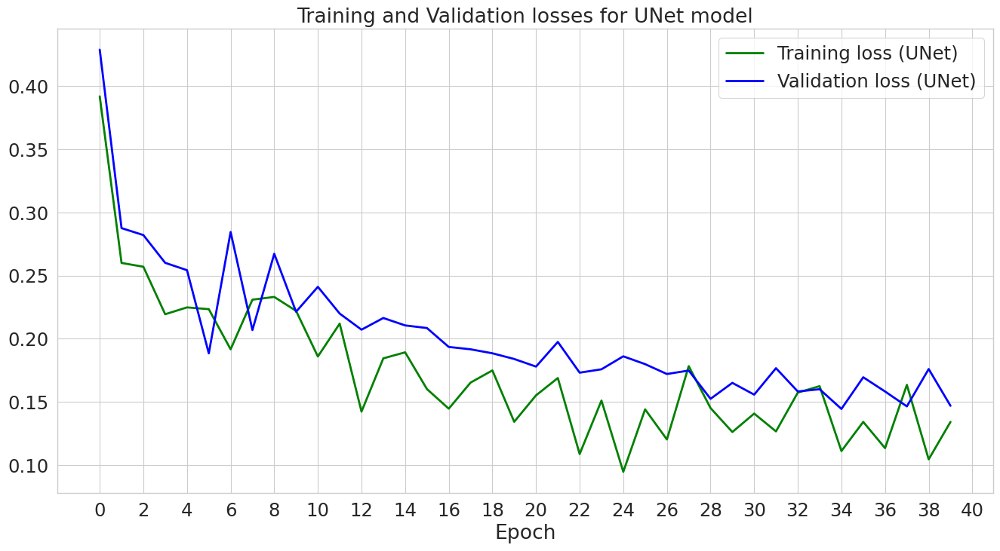

In [72]:
plt.figure(figsize=(16,8))
plt.plot(training_loss, 'g-', label='Training loss (UNet)', linewidth=2)
plt.plot(validation_loss, 'b-', label='Validation loss (UNet)', linewidth=2)
plt.xlabel("Epoch")
plt.xticks([0,2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40])
plt.legend();
plt.title("Training and Validation losses for UNet model")
plt.savefig('Unet_Losses', dpi=300, bbox_inches='tight')

### Testing the UNet model

In [73]:
# A function to calculate testing metrics
def calculate_metrics(y_true, y_pred):
    """ Ground truth """
    y_true = y_true.cpu().numpy()
    y_true = y_true > 0.5
    y_true = y_true.astype(np.uint8)
    y_true = y_true.reshape(-1)

    """ Prediction """
    y_pred = y_pred.cpu().numpy()
    y_pred = y_pred > 0.5
    y_pred = y_pred.astype(np.uint8)
    y_pred = y_pred.reshape(-1)

    score_jaccard = jaccard_score(y_true, y_pred)
    score_f1 = f1_score(y_true, y_pred)
    score_recall = recall_score(y_true, y_pred)
    score_precision = precision_score(y_true, y_pred)
    score_acc = accuracy_score(y_true, y_pred)

    return [score_jaccard, score_f1, score_recall, score_precision, score_acc]

def mask_parse(mask):
    mask = np.expand_dims(mask, axis=-1)    ## (416, 416, 1)
    mask = np.concatenate([mask, mask, mask, mask, mask, mask], axis=-1)  ## (416, 416, 6)
    return mask

if __name__ == "__main__":

    """ Create a folder to store resulting masks """
    create_dir("results")

    """ Load test dataset (7 images) """
    test_x = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_images/*.tif"))
    test_y = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_masks/*.tif"))

    """ Hyperparameters """
    H = 416
    W = 416
    size = (W, H)
    checkpoint_path = "files/checkpoint.pth"

    """ Load the checkpoint """
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = build_unet()
    model = model.to(device)
    """ Loading the best result of trained model """
    model.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model.eval()
    """ Creating containers for metrics and time taken """
    metrics_score = [0.0, 0.0, 0.0, 0.0, 0.0]
    time_taken = []

    for i, (x, y) in tqdm(enumerate(zip(test_x, test_y)), total=len(test_x)):
        """ Extract the name of the test mask """
        name = x.split(".")[1]
        print("  Test image " + name)

        with rasterio.open(test_x[i], 'r') as img_src, rasterio.open(test_y[i]) as msk_src:
            image = reshape_as_image(img_src.read()) # (416, 416, 6 )
            x = np.transpose(image, (2, 0, 1))  # (6, 416, 416)
            x = np.expand_dims(x, axis=0)
            x = x.astype(np.float32)
            x = torch.from_numpy(x)
            x = x.to(device)

            mask = reshape_as_image(msk_src.read())
            y = np.expand_dims(mask, axis=0) ## (1, 416, 416)
            y = y.astype(np.float32)
            y = torch.from_numpy(y)
            y = y.to(device)


        with torch.no_grad():
            """ Prediction and Calculating FPS """
            start_time = time.time()
            pred_y = model(x)
            pred_y = torch.sigmoid(pred_y)
            total_time = time.time() - start_time
            time_taken.append(total_time)


            score = calculate_metrics(y, pred_y)
            metrics_score = list(map(add, metrics_score, score))
            pred_y = pred_y[0].cpu().numpy()        # (1, 416, 416)
            pred_y = np.squeeze(pred_y, axis=0)     # (416, 416)
            pred_y = pred_y > 0.5
            pred_y = np.array(pred_y, dtype=np.uint8)

        """ Saving masks using the extracted name """

        cv2.imwrite(f"results/{name}.png", pred_y)

    # Metrics
    jaccard = metrics_score[0]/len(test_x)
    f1 = metrics_score[1]/len(test_x)
    recall = metrics_score[2]/len(test_x)
    precision = metrics_score[3]/len(test_x)
    acc = metrics_score[4]/len(test_x)

    print(f"  Test metrics results: Jaccard: {jaccard:1.4f} - F1: {f1:1.4f} - Recall: {recall:1.4f} - Precision: {precision:1.4f} - Acc: {acc:1.4f}")

  0%|          | 0/7 [00:00<?, ?it/s]

  Test image 37


 14%|█▍        | 1/7 [00:01<00:07,  1.18s/it]

  Test image 38


 29%|██▊       | 2/7 [00:02<00:06,  1.21s/it]

  Test image 40


 43%|████▎     | 3/7 [00:03<00:05,  1.33s/it]

  Test image 41


 57%|█████▋    | 4/7 [00:05<00:03,  1.33s/it]

  Test image 44


 71%|███████▏  | 5/7 [00:06<00:02,  1.33s/it]

  Test image 45


 86%|████████▌ | 6/7 [00:07<00:01,  1.35s/it]

  Test image 46


100%|██████████| 7/7 [00:09<00:00,  1.33s/it]

  Test metrics results: Jaccard: 0.9361 - F1: 0.9664 - Recall: 0.9527 - Precision: 0.9817 - Acc: 0.9804


### Visualizing the result of UNet model prediction

In [74]:
# Ranging values for visualization
def scaleMinMax(x):
    return((x - np.nanmin(x))/(np.nanmax(x) - np.nanmin(x)))

# Adopted from https://albumentations.ai/docs/examples/example_kaggle_salt/ with minor modifications
from PIL import Image
def visualize(image, mask, predicted_mask=None, additional_images=None, in_rows=False):
    fontsize = 24

    # if additional_images is None:
    num_img = 2 + (predicted_mask is not None)
    fig_size = num_img * 8

    if in_rows:
        f, ax = plt.subplots(1, num_img, figsize=(fig_size, fig_size))
    else:
        f, ax = plt.subplots(num_img, 1, figsize=(fig_size, fig_size))

    # Extracting each array(band) to make a RGB image

    image_r = image[:,:,2] # red band
    image_g = image[:,:,1] # green band
    image_b = image[:,:,0] # blue band

    image_r = scaleMinMax(image_r)
    image_g = scaleMinMax(image_g)
    image_b = scaleMinMax(image_b)

    image_rgb = np.dstack((image_r,image_g,image_b))

    ax[0].imshow(image_rgb)
    ax[0].set_title('Original image', fontsize=fontsize)
    ax[0].grid()
    ax[0].set_yticklabels([])
    ax[0].set_xticklabels([])
    ax[1].imshow(mask)
    ax[1].set_title('Original mask', fontsize=fontsize)
    ax[1].grid()
    ax[1].set_yticklabels([])
    ax[1].set_xticklabels([])

    if predicted_mask is not None:
        ax[2].imshow(predicted_mask)
        ax[2].set_title('Predicted Mask', fontsize=fontsize)
        ax[2].grid()
        ax[2].set_yticklabels([])
        ax[2].set_xticklabels([])

In [75]:
# Separate class for test images
class Alaska_Test_Dataset(Dataset):
    """Constructs dataset of Alaska wilfire burn scars and their labelling masks.

    The class construction reads in image-and-mask pairs from the given paths
    and preprocessing if they are specified.

    Parameters
    ----------
    img_paths : list of str
        List of directory paths leading to each of the data images (must be
        readable by the `rasterio` module). The order must correspond to those
        given in `msk_paths` such that each image corresponds to its mask.
    msk_paths : list of str
        List of directory paths leading to each of the data masks (must be
        readable by the `rasterio` module). The order must correspond to those
        given in `img_paths` such that each image corresponds to its mask.
    """
    def __init__(self, images_path, masks_path):

        self.images_path = images_path
        self.masks_path = masks_path
        self.n_samples = len(images_path)

    def __getitem__(self, index):

        with rasterio.open(self.images_path[index], 'r') as img_src, rasterio.open(self.masks_path[index]) as msk_src:
            image = reshape_as_image(img_src.read())
            image = image.astype(np.float32)
            image = torch.from_numpy(image)

            mask = reshape_as_image(msk_src.read())
            mask = mask.astype(np.float32)
            mask = torch.from_numpy(mask)

        return image, mask

    def __len__(self):
        return self.n_samples

dataset_result = Alaska_Test_Dataset(test_x, test_y)

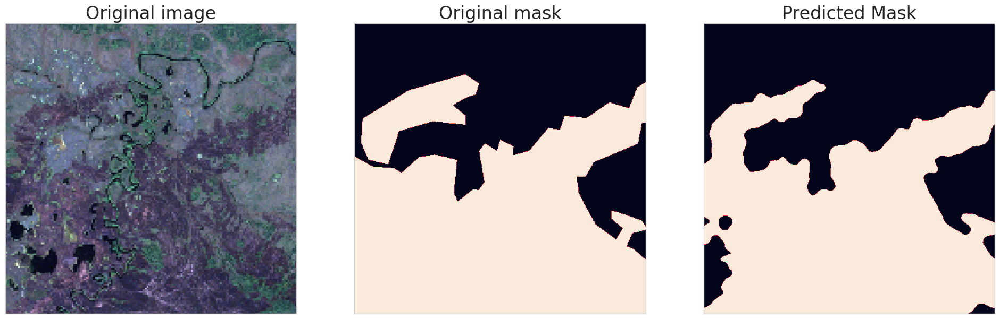

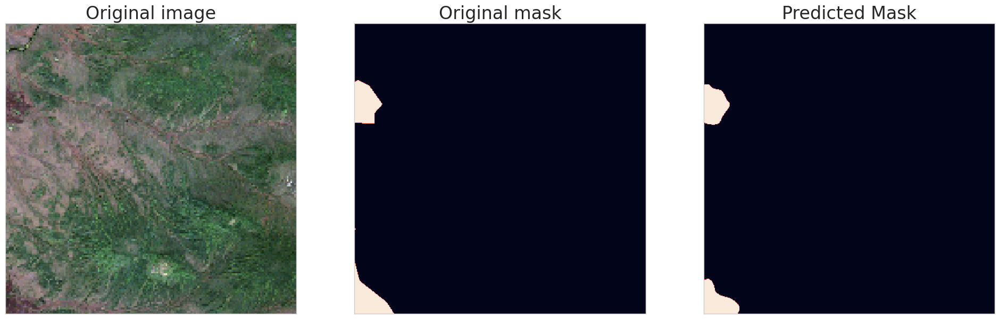

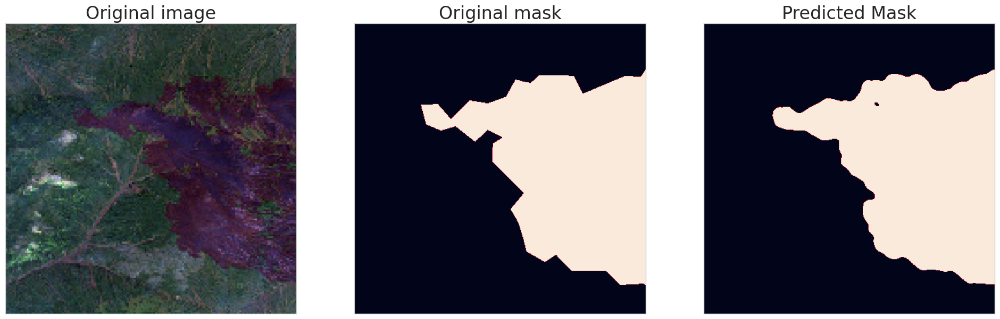

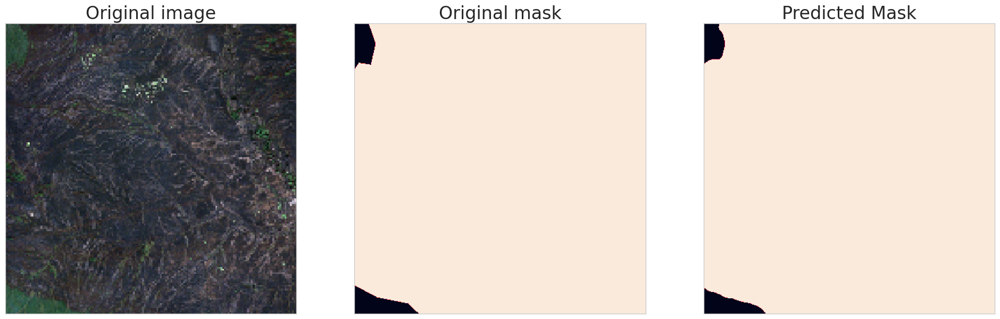

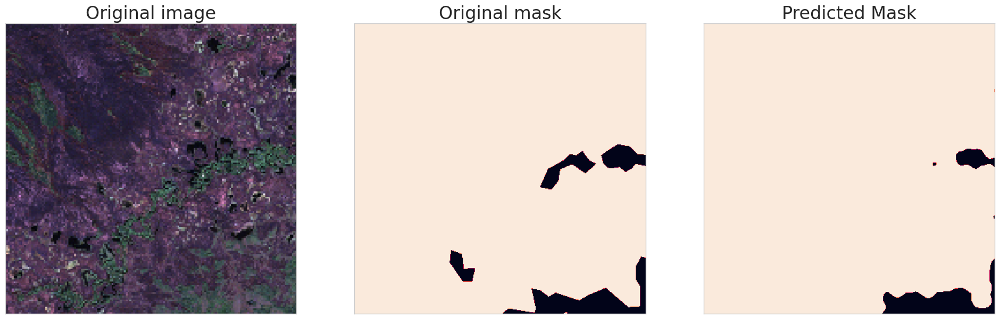

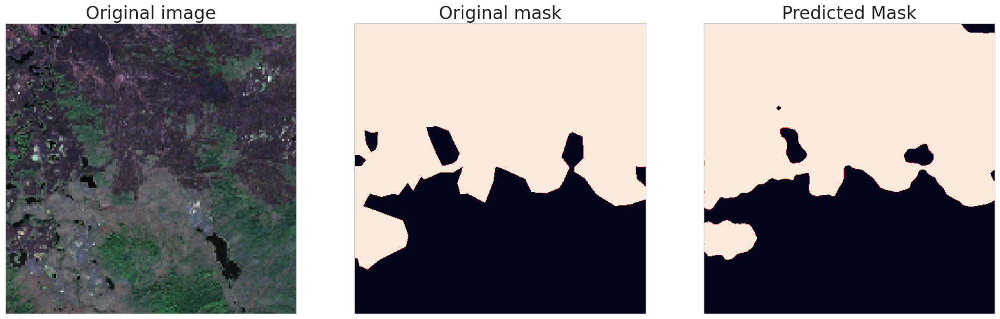

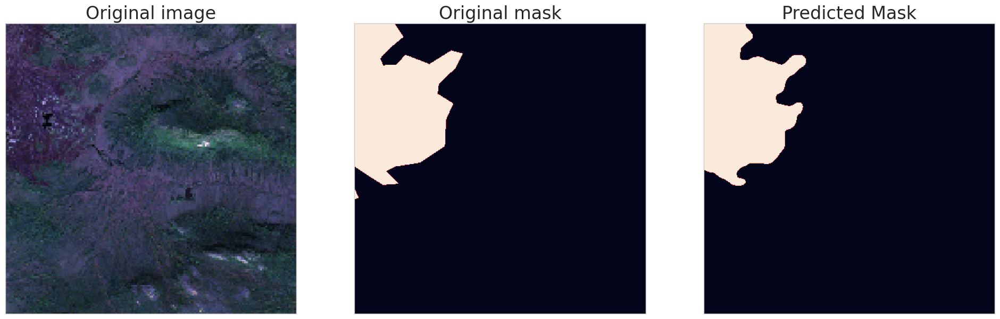

In [76]:
# plots
import imageio
for i in range(7):
    image_original, mask_original = dataset_result[i]
    predictions = sorted(glob("results/*.png"))
    predicted_mask = imageio.imread(predictions[i])
    mask_original = np.squeeze(mask_original, axis=2)
    visualize(image_original, mask_original, predicted_mask, in_rows=True)

### Confusion matrix


In [77]:
# Predictions - masks predicted by UNet model
preds = sorted(glob("results/*.png"))
# Targets - original masks
targets = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_masks/*.tif"))

In [78]:
# Assigning targets - reading each mask separetely and converting it to tensor with uint8
targets_mask = imageio.imread(targets[0])
targets_mask = torch.tensor(targets_mask)
targets_mask = targets_mask.to(torch.uint8)

targets_mask_1 = imageio.imread(targets[1])
targets_mask_1 = torch.tensor(targets_mask_1)
targets_mask_1 = targets_mask_1.to(torch.uint8)

targets_mask_2 = imageio.imread(targets[2])
targets_mask_2 = torch.tensor(targets_mask_2)
targets_mask_2 = targets_mask_2.to(torch.uint8)

targets_mask_3 = imageio.imread(targets[3])
targets_mask_3 = torch.tensor(targets_mask_3)
targets_mask_3 = targets_mask_3.to(torch.uint8)

targets_mask_4 = imageio.imread(targets[4])
targets_mask_4 = torch.tensor(targets_mask_4)
targets_mask_4 = targets_mask_4.to(torch.uint8)

targets_mask_5 = imageio.imread(targets[5])
targets_mask_5 = torch.tensor(targets_mask_5)
targets_mask_5 = targets_mask_5.to(torch.uint8)

targets_mask_6 = imageio.imread(targets[6])
targets_mask_6 = torch.tensor(targets_mask_6)
targets_mask_6 = targets_mask_6.to(torch.uint8)

# Assigning predictions - reading each mask separetaly and converting it tensor
preds_mask = imageio.imread(preds[0])
preds_mask = torch.tensor(preds_mask)
preds_mask_1 = imageio.imread(preds[1])
preds_mask_1 = torch.tensor(preds_mask_1)
preds_mask_2 = imageio.imread(preds[2])
preds_mask_2 = torch.tensor(preds_mask_2)
preds_mask_3 = imageio.imread(preds[3])
preds_mask_3 = torch.tensor(preds_mask_3)
preds_mask_4 = imageio.imread(preds[4])
preds_mask_4 = torch.tensor(preds_mask_4)
preds_mask_5 = imageio.imread(preds[5])
preds_mask_5 = torch.tensor(preds_mask_5)
preds_mask_6 = imageio.imread(preds[6])
preds_mask_6 = torch.tensor(preds_mask_6)

In [79]:
# join tensors for predicted masks
all_preds_masks = torch.stack((preds_mask, preds_mask_1, preds_mask_2,
                               preds_mask_3, preds_mask_4, preds_mask_5, preds_mask_6))

# join tensors for original masks
all_targets_masks = torch.stack((targets_mask, targets_mask_1,targets_mask_2,
                                 targets_mask_3,targets_mask_4,targets_mask_5, targets_mask_6))

In [80]:
# Calculating a confusion matrix with binary task
confmat = ConfusionMatrix(task="binary", num_classes=2)
cm = confmat(all_preds_masks, all_targets_masks)
cm = cm.to('cpu').numpy()
cm

array([[582980,   9932],
       [ 13844, 604636]])

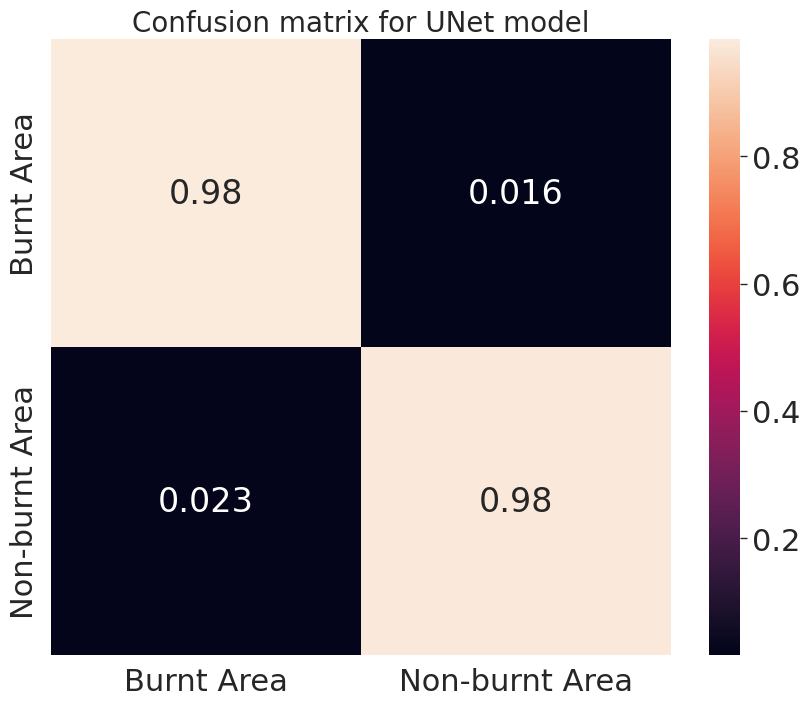

In [81]:
import seaborn as sn
import pandas as pd
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=2.5, rc={"lines.linewidth": 1.2})

# constant for classes
classes = ('Burnt Area', 'Non-burnt Area')

df_cm = pd.DataFrame((cm / np.sum(cm, axis=1)), index = [i for i in classes],
                     columns = [i for i in classes])
plt.figure(figsize = (10,8))
plt.title('Confusion matrix for UNet model', fontsize=20)
sn.heatmap(df_cm, annot=True);
plt.savefig('Output_CM_Unet.png')

## ResNet101UNet model

To enable comparability between the results obtained from supervised machine
learning and transfer learning, a pre-trained ResNet101UNet model is employed in this study. Specifically, the segmentation-models-pytorch Python library,
which employs neural networks for image segmentation using the PyTorch framework, is utilized. The library uses the ResNet101 architecture as an encoder for a new model and its pretrained weights from the ImageNet dataset, on which the model has been trained to enable the transfer of knowledge from the pre-existing model to the target domain.

In [82]:
class Alaska_Dataset_Pretrained(Dataset):
    """Constructs dataset of Alaska wilfire burn scars and their labelling masks.

    The class construction reads in image-and-mask pairs from the given paths,
    augmentations and preprocessing if they are specified.

    Parameters
    ----------
    img_paths : list of str
        List of directory paths leading to each of the data images (must be
        readable by the `rasterio` module). The order must correspond to those
        given in `msk_paths` such that each image corresponds to its mask.
    msk_paths : list of str
        List of directory paths leading to each of the data masks (must be
        readable by the `rasterio` module). The order must correspond to those
        given in `img_paths` such that each image corresponds to its mask.
    augmentations : instance of the albumentation.Compose class
        Data augmentation pipeline that transform images (e.g. flip, transpose,
        rotate, crop, distort, brightness, contrast), composed with the
        Albumentation library.
    preprocessing : instance of the albumentation.Compose class
        Data preprocessing pipeline that transform images (e.g. normalise, type-
        convert), composed with the Albumentation library via the use of
        `albumentation.Lambda` method.

    """
    def __init__(self, img_paths, msk_paths, augmentations=None, preprocessing=None):
        self.img_paths = img_paths
        self.msk_paths = msk_paths
        self.augmentations = augmentations
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.msk_paths)

    def __getitem__(self, idx):

        # Read the image-mask pairs
        with rasterio.open(self.img_paths[idx], 'r') as img_src, rasterio.open(self.msk_paths[idx]) as msk_src:
            image = reshape_as_image(img_src.read())
            mask = reshape_as_image(msk_src.read())

        # Apply augmentations
        if self.augmentations:
            augmented = self.augmentations(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        # Apply any preprocessing required for specific models
        if self.preprocessing:
            preprocessed = self.preprocessing(image=image, mask=mask)
            image, mask = preprocessed['image'], preprocessed['mask']

        return image, mask

In [84]:
class Alaska_Subset(Dataset):
    """Constructs dataset from subsets in order to retain augmentation options.

    The `torch.utils.data.dataset.Subset` instances resulting from the
    `torch.utils.data.random_split` function does not retain the transform
    attributes, preventing different transformations to be applied to the
    training and validation split from the original dataset. This dummy
    class reintroduces such attributes. Note that it is best to use subsets
    without any transformations here, and add all the transformations in this
    dummy class instead.

    Parameters
    ----------
    subset : torch.utils.data.dataset.Subset instance
        The subset generated by the `random_split` method.
    augmentations : instance of the albumentation.Compose class
        Data augmentation pipeline that transform images (e.g. flip, transpose,
        rotate, crop, distort, brightness, contrast), composed with the
        Albumentation library.
    preprocessing : instance of the albumentation.Compose class
        Data preprocessing pipeline that transform images (e.g. normalise, type-
        convert), composed with the Albumentation library via the use of
        `albumentation.Lambda` method.

    """
    def __init__(self, subset, augmentations=None, preprocessing=None):
        self.subset = subset
        self.augmentations = augmentations
        self.preprocessing = preprocessing

    def __len__(self):
        return len(self.subset)

    def __getitem__(self, idx):
        image, mask = self.subset[idx]

        # Apply augmentations
        if self.augmentations:
            augmented = self.augmentations(image=image, mask=mask)
            image, mask = augmented['image'], augmented['mask']

        # Apply any preprocessing required for specific models
        if self.preprocessing:
            preprocessed = self.preprocessing(image=image, mask=mask)
            image, mask = preprocessed['image'], preprocessed['mask']

        return image, mask

In [85]:
def get_training_augmentations(original_height, original_width, n=0):

    if n:
        # for 416x416 images
        padded_height = original_height
        padded_width = original_width


    transformations = [

        A.OneOf([
            A.HorizontalFlip(p=0.5),
            A.VerticalFlip(p=0.5),
            A.RandomRotate90(p=0.5),
            ], p=0.8)]

    return A.Compose(transformations)

In [86]:
def get_validation_augmentations(original_height, original_width, n=0):
    if n:

        # for 416x416 images
        padded_height = original_height
        padded_width = original_width

    transformation = [
        A.PadIfNeeded(min_height=padded_height,
                      min_width=padded_width,
                      p=1)
    ]

    return A.Compose(transformation)

# Make an alias for test-data augmentations
get_test_augmentations = get_validation_augmentations

In [87]:
def to_tensor(x, torch_type=torch.float, reshape_fn=None, **kwargs):
    """Convert NumPy array to PyTorch Tensor of specified type.

    Parameters
    ----------
    x : numpy.ndarray object
        The NumPy array to be converted.
    torch_type : torch.dtype object
        The dtype into which to cast the `torch.Tensor` object. Default
        is `torch.float32`.
    reshape_fn : function
        The function used to reshape `x` before converting to a `torch.Tensor`.

    Returns
    -------
    torch.Tensor
        The `torch.Tensor` version of the input `x`.

    """
    if reshape_fn:
        x = reshape_fn(x)
    return torch.from_numpy(x).to(torch.float32)


# Make `to_tensor` functions with pre-filled `torch_type` field.
to_tensor_float32 = partial(to_tensor, torch_type=torch.float32, reshape_fn=reshape_as_raster)
to_tensor_uint8 = partial(to_tensor, torch_type=torch.uint8, reshape_fn=reshape_as_raster)


def get_preprocessing(preprocessing_fn=None):
    """Get the preprocessing transforms required for the pre-trained models.

    The process also includes conversion of images and masks from
    `numpy.ndarray` to `torch.Tensor` with types `torch.float32` and
    `torch.uint8`, respectively.

    Parameters
    ----------
    preprocessing_fn : functools.partial object from `smp.encoders.get_preprocessing_fn`
        The preprocessing required such that input is suitable for use with
        an encoder that is pretrained. The default is None.

    Returns
    -------
    albumentations.core.composition.Compose
        The callable composition of all relevant transforms.

    """
    # Note: `reshape_as_raster` reshapes (height, width, bands) to
    #       (bands, height, width).
    preprocess = [
        A.Lambda(image=preprocessing_fn),
        A.Lambda(image=to_tensor_float32, mask=to_tensor_uint8)
    ]

    if preprocessing_fn is None:
        preprocess.pop(0)

    return A.Compose(preprocess)

In [88]:
ORIGINAL_HEIGHT = 416
ORIGINAL_WIDTH = 416

In [89]:
paths_to_images = sorted(glob("/content/drive/MyDrive/Thesis/Images_for_random/*.tif"))
paths_to_masks = sorted(glob("/content/drive/MyDrive/Thesis/Masks_for_random/*.tif"))
dataset_noaugment = Alaska_Dataset_Pretrained(paths_to_images, paths_to_masks)

test_x = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_images/*.tif"))
test_y = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_masks/*.tif"))
test_dataset_noaugment = Alaska_Dataset_Pretrained(test_x, test_y)

In [90]:
# Default split is used to have a good number of images for validation as the dataset is small
train_subset, valid_subset = random_data_split(dataset_noaugment, (0.7, 0.3))

Available data size:           68

Split into:
Training set size:             47
Validation set size:           21
---------------------------------
Total (for verification):      68



In [91]:
train_set = Alaska_Subset(
    train_subset,
    augmentations=get_training_augmentations(original_height=ORIGINAL_HEIGHT,
                                             original_width=ORIGINAL_WIDTH,
                                             n=5),
    preprocessing=get_preprocessing()
)

valid_set = Alaska_Subset(
    valid_subset,
    augmentations=get_validation_augmentations(original_height=ORIGINAL_HEIGHT,
                                               original_width=ORIGINAL_WIDTH,
                                               n=5),
    preprocessing=get_preprocessing()
)

test_set = Alaska_Subset(
    test_dataset_noaugment,
    augmentations=get_test_augmentations(original_height=ORIGINAL_HEIGHT,
                                         original_width=ORIGINAL_WIDTH,
                                         n=5),
    preprocessing=get_preprocessing()
)

### Set up the model

In [92]:
# After numerous trials of different encoders `resnet101` has been chosen as giving the best results
ENCODER = 'resnet101'
ENCODER_WEIGHTS = 'imagenet'

model = smp.UnetPlusPlus(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    in_channels=6,
    classes=1,
    activation='sigmoid' #for multiclass segmentation ('sigmoid' for binary segmentation)
)

Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth
100%|██████████| 170M/170M [00:00<00:00, 273MB/s]


In [93]:
train_loader = DataLoader(train_set, batch_size=2, shuffle=True)
valid_loader = DataLoader(valid_set, batch_size=2, shuffle=False)

In [94]:
image_t, mask_t = next(iter(train_loader))
image_v, mask_v = next(iter(valid_loader))

In [95]:
# All necessary evaluation metrics
loss = smp.utils.losses.DiceLoss()
metrics = [
    smp.utils.metrics.IoU(threshold=0.5), # Jaccard score
    smp.utils.metrics.Fscore(threshold=0.5), # F1 score
    smp.utils.metrics.Accuracy(threshold=0.5), # Accuracy
    smp.utils.metrics.Recall(threshold=0.5), # Recall
    smp.utils.metrics.Precision(threshold=0.5) # Precison
]

optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.0001),
])

In [96]:
# create epoch runners
# it is a simple loop of iterating over dataloader`s samples

DEVICE = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

train_epoch = smp.utils.train.TrainEpoch(
    model,
    loss=loss,
    metrics=metrics,
    optimizer=optimizer,
    verbose=True,
    device=DEVICE
)

valid_epoch = smp.utils.train.ValidEpoch(
    model,
    loss=loss,
    metrics=metrics,
    verbose=True,
    device=DEVICE,
)

In [97]:
# train model for 40 epochs

max_score = 0
# Empty "boxes" to store training and validation losses
training = []
validating = []

for i in range(0, 40):

    print('\nEpoch: {}'.format(i))
    train_logs = train_epoch.run(train_loader)
    valid_logs = valid_epoch.run(valid_loader)

    """ Appending losses """
    training.append(train_logs)
    validating.append(valid_logs)

    # do something (save model, change lr, etc.)
    if max_score < valid_logs['iou_score']:
        max_score = valid_logs['iou_score']
        torch.save(model, './best_model.pth')
        print('Model saved!')

    if i == 25:
        optimizer.param_groups[0]['lr'] = 1e-5
        print('Decrease decoder learning rate to 1e-5!')


Epoch: 0
valid: 100%|██████████| 11/11 [00:02<00:00,  4.45it/s, dice_loss - 0.3144, iou_score - 0.8089, fscore - 0.8893, accuracy - 0.9185, recall - 0.8818, precision - 0.907]
Model saved!

Epoch: 1
valid: 100%|██████████| 11/11 [00:02<00:00,  4.86it/s, dice_loss - 0.2916, iou_score - 0.8469, fscore - 0.9137, accuracy - 0.9328, recall - 0.949, precision - 0.8881]
Model saved!

Epoch: 2
valid: 100%|██████████| 11/11 [00:02<00:00,  4.94it/s, dice_loss - 0.2498, iou_score - 0.8587, fscore - 0.9204, accuracy - 0.9368, recall - 0.9678, precision - 0.8847]
Model saved!

Epoch: 3
valid: 100%|██████████| 11/11 [00:02<00:00,  4.91it/s, dice_loss - 0.229, iou_score - 0.8225, fscore - 0.8972, accuracy - 0.9145, recall - 0.9876, precision - 0.8315]

Epoch: 4
valid: 100%|██████████| 11/11 [00:02<00:00,  4.87it/s, dice_loss - 0.2221, iou_score - 0.8625, fscore - 0.9225, accuracy - 0.9423, recall - 0.9512, precision - 0.9027]
Model saved!

Epoch: 5
valid: 100%|██████████| 11/11 [00:02<00:00,  4.62it

### Loss functions

In [98]:
pretrained_training_loss = []
pretrained_validation_loss = []
for i in range(0,40):
    pretrained_training_loss.append((training[i]['dice_loss']))
    pretrained_validation_loss.append((validating[i]['dice_loss']))

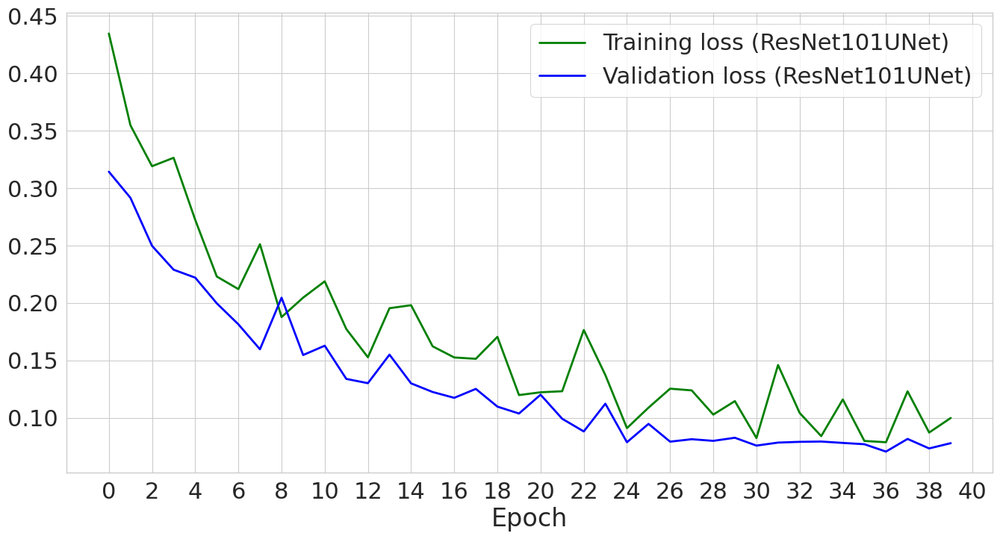

In [99]:
plt.figure(figsize=(16,8))
plt.plot(pretrained_training_loss, 'g-', label='Training loss (ResNet101UNet)', linewidth=2)
plt.plot(pretrained_validation_loss, 'b-', label='Validation loss (ResNet101UNet)', linewidth=2)
plt.xlabel("Epoch")
plt.xticks([0,2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40])
plt.legend();
plt.savefig('ResNet101Unet_Losses', dpi=300, bbox_inches='tight')

### Testing a model

In [100]:
best_model = torch.load("./best_model.pth")

In [101]:
test_loader = DataLoader(test_set)

In [102]:
test_epoch = smp.utils.train.ValidEpoch(
    model=best_model,
    loss=loss,
    metrics=metrics
)

In [103]:
logs = test_epoch.run(test_loader)

valid: 100%|██████████| 7/7 [00:31<00:00,  4.45s/it, dice_loss - 0.1342, iou_score - 0.9332, fscore - 0.9649, accuracy - 0.9786, recall - 0.9825, precision - 0.948]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 52996.62it/s]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 29156.04it/s]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 63140.06it/s]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 56899.47it/s]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 4911.36it/s]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 2446.07it/s]


torch.Size([1, 416, 416])


100%|██████████| 7/7 [00:00<00:00, 66879.56it/s]


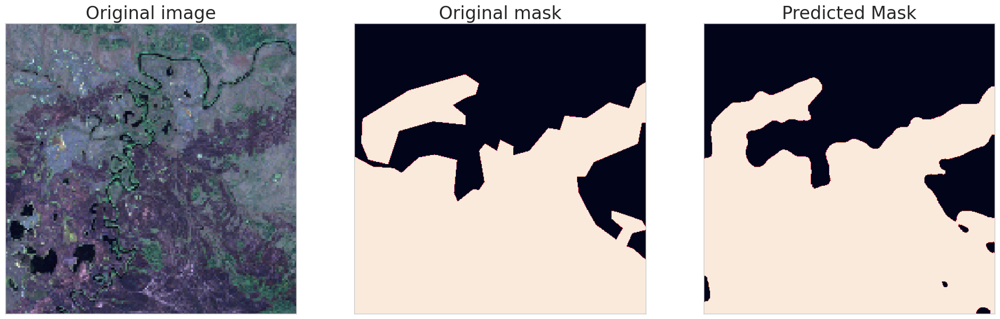

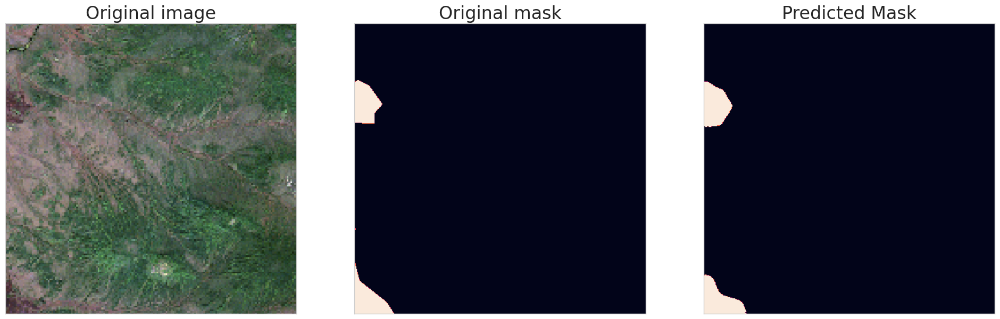

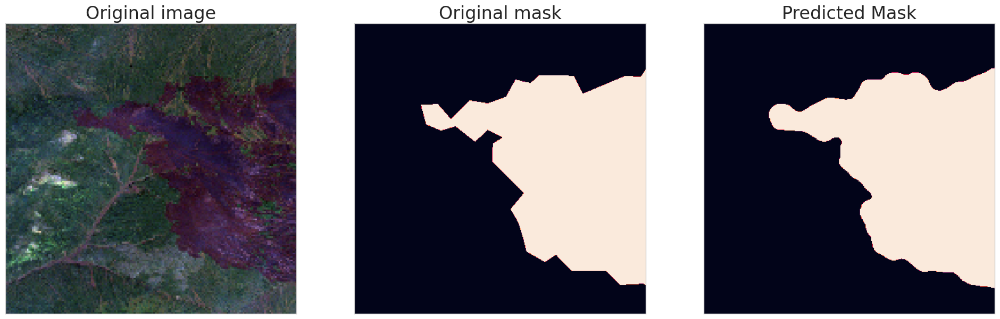

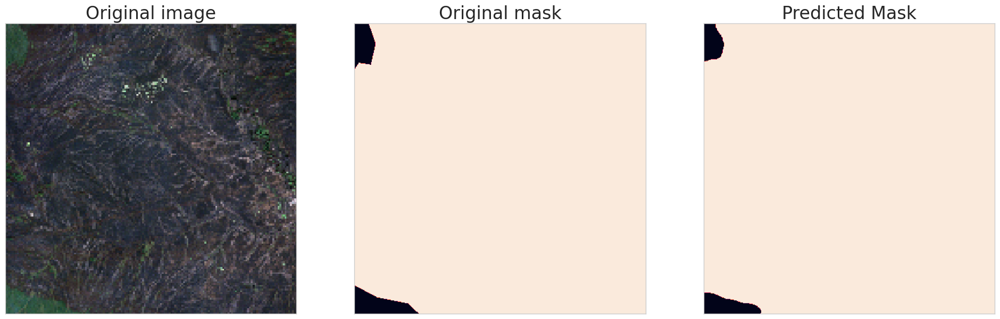

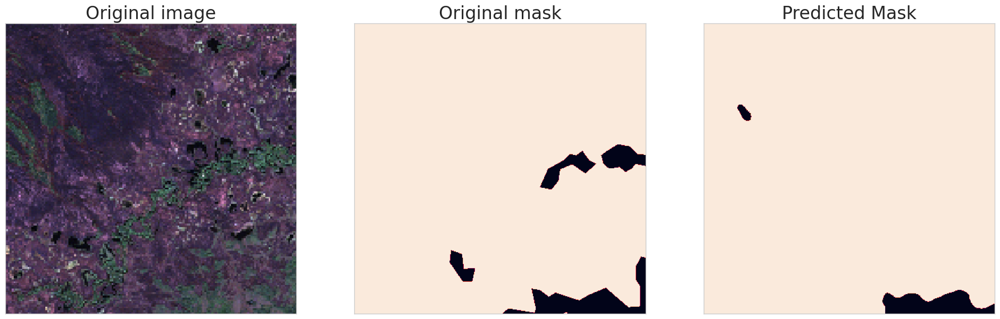

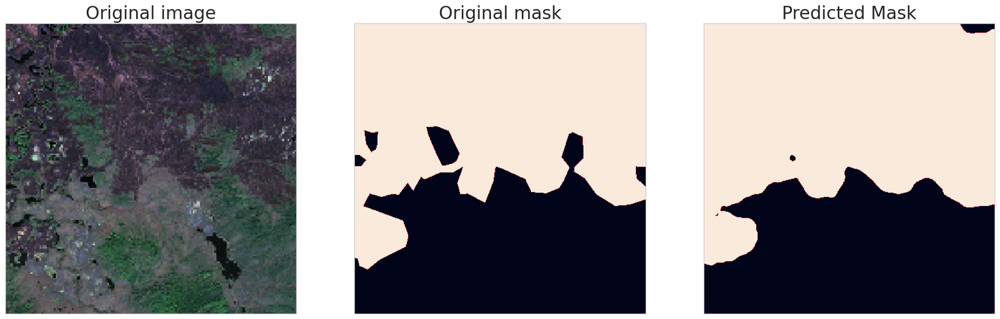

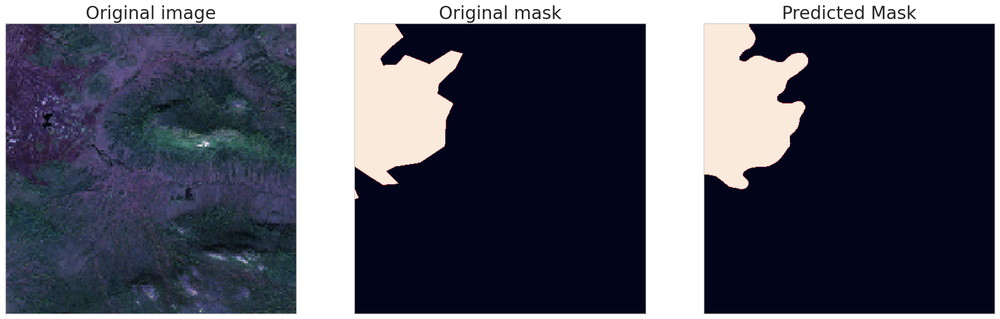

In [104]:
from pickle import STOP
from tqdm import tqdm
import cv2

create_dir("results_pretrained")
name_1 = []

for i in range(7):
    image_padded, mask_padded = test_set[i]

    predicted_mask_padded = best_model.predict(image_padded.unsqueeze(0)).squeeze(0)

    unpad = A.CenterCrop(height=ORIGINAL_HEIGHT, width=ORIGINAL_WIDTH, p=1)

    print(predicted_mask_padded.shape)

    unpadded = unpad(
      image=reshape_as_image(image_padded.numpy()),
      mask=reshape_as_image(mask_padded.numpy()),
    )
    unpadded_p = unpad(
      image=reshape_as_image(image_padded.numpy()),
      mask=reshape_as_image(predicted_mask_padded.numpy())
    )

    image = unpadded['image']
    mask = unpadded['mask']
    predicted_mask = unpadded_p['mask']

    visualize(
      image=image,
      mask=mask[:,:,0],
      predicted_mask=predicted_mask.round()[:,:,0],
      in_rows=True
    )

    for j, (x, y) in tqdm(enumerate(zip(test_x, test_y)), total=len(test_x)):
      """ Extract the name """
      name = x[50:].split(".")[0]
      name_1.append(name)

    cv2.imwrite(f"results_pretrained/{name_1[i]}.png", predicted_mask)

### Confusion matrix

In [105]:
preds = sorted(glob("results_pretrained/*.png"))
targets = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_masks/*.tif"))
print(preds)
print(targets)

['results_pretrained/37.png', 'results_pretrained/38.png', 'results_pretrained/40.png', 'results_pretrained/41.png', 'results_pretrained/44.png', 'results_pretrained/45.png', 'results_pretrained/46.png']
['/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.37.tif', '/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.38.tif', '/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.40.tif', '/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.41.tif', '/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.44.tif', '/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.45.tif', '/content/drive/MyDrive/Thesis/Split/Test_masks/9.masks.46.tif']


In [106]:
# Assigning targets
targets_mask = imageio.imread(targets[0])
targets_mask = torch.tensor(targets_mask)
targets_mask = targets_mask.to(torch.uint8)

targets_mask_1 = imageio.imread(targets[1])
targets_mask_1 = torch.tensor(targets_mask_1)
targets_mask_1 = targets_mask_1.to(torch.uint8)

targets_mask_2 = imageio.imread(targets[2])
targets_mask_2 = torch.tensor(targets_mask_2)
targets_mask_2 = targets_mask_2.to(torch.uint8)

targets_mask_3 = imageio.imread(targets[3])
targets_mask_3 = torch.tensor(targets_mask_3)
targets_mask_3 = targets_mask_3.to(torch.uint8)

targets_mask_4 = imageio.imread(targets[4])
targets_mask_4 = torch.tensor(targets_mask_4)
targets_mask_4 = targets_mask_4.to(torch.uint8)

targets_mask_5 = imageio.imread(targets[5])
targets_mask_5 = torch.tensor(targets_mask_5)
targets_mask_5 = targets_mask_5.to(torch.uint8)

targets_mask_6 = imageio.imread(targets[6])
targets_mask_6 = torch.tensor(targets_mask_6)
targets_mask_6 = targets_mask_6.to(torch.uint8)

# Assigning predictions
preds_mask = imageio.imread(preds[0])
preds_mask = torch.tensor(preds_mask)
preds_mask_1 = imageio.imread(preds[1])
preds_mask_1 = torch.tensor(preds_mask_1)
preds_mask_2 = imageio.imread(preds[2])
preds_mask_2 = torch.tensor(preds_mask_2)
preds_mask_3 = imageio.imread(preds[3])
preds_mask_3 = torch.tensor(preds_mask_3)
preds_mask_4 = imageio.imread(preds[4])
preds_mask_4 = torch.tensor(preds_mask_4)
preds_mask_5 = imageio.imread(preds[5])
preds_mask_5 = torch.tensor(preds_mask_5)
preds_mask_6 = imageio.imread(preds[6])
preds_mask_6 = torch.tensor(preds_mask_6)

In [107]:
# join tensors for predicted masks
all_preds_masks = torch.stack((preds_mask, preds_mask_1, preds_mask_2,
                               preds_mask_3, preds_mask_4, preds_mask_5, preds_mask_6))

# join tensors for original masks
all_targets_masks = torch.stack((targets_mask, targets_mask_1,targets_mask_2,
                                 targets_mask_3,targets_mask_4,targets_mask_5, targets_mask_6))

In [108]:
# Calculating a confusion matrix with binary task
confmat = ConfusionMatrix(task="binary", num_classes=2)
cm = confmat(all_preds_masks, all_targets_masks)
cm = cm.to('cpu').numpy()
cm

array([[571668,  21244],
       [  4674, 613806]])

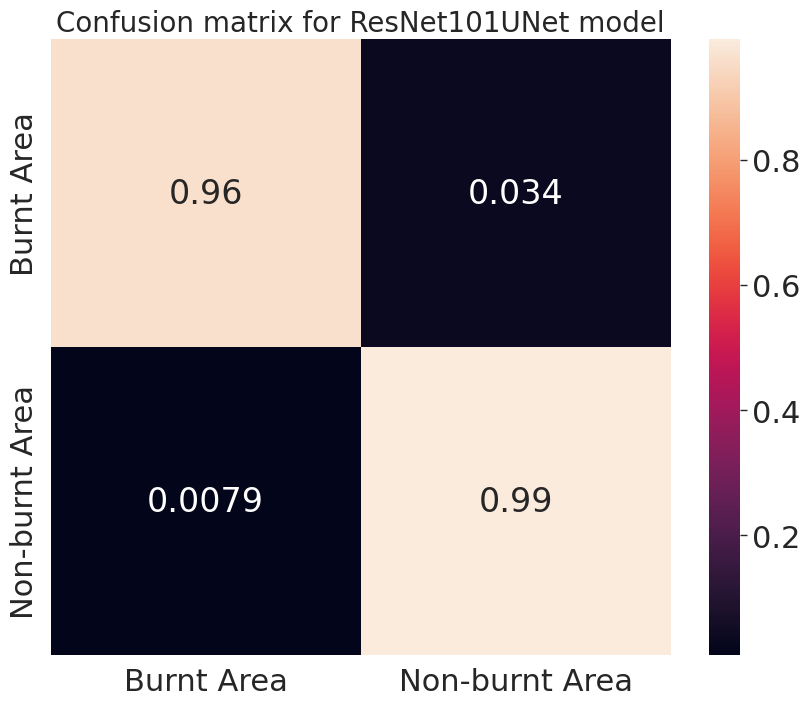

In [109]:
import seaborn as sn
import pandas as pd
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=2.5, rc={"lines.linewidth": 1.2})

# constant for classes
classes = ('Burnt Area', 'Non-burnt Area')

df_cm = pd.DataFrame((cm / np.sum(cm, axis=1)), index = [i for i in classes],
                     columns = [i for i in classes])
plt.figure(figsize = (10,8))
plt.title('Confusion matrix for ResNet101UNet model', fontsize=20)
sn.heatmap(df_cm, annot=True);
plt.savefig('Output_pretrained_CM.png')

## Models comparison

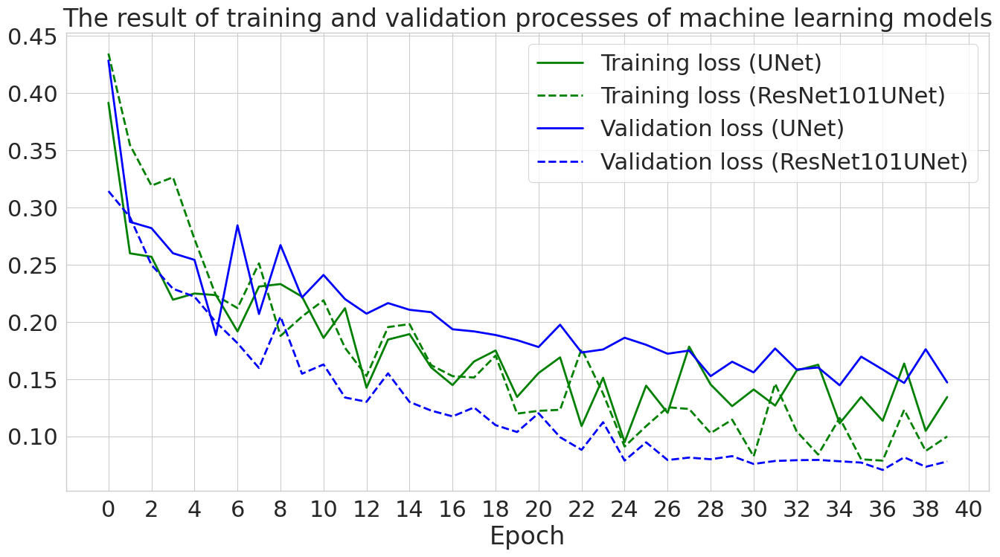

In [110]:
# losses
plt.figure(figsize=(16,8))
plt.plot(training_loss,'g-', label='Training loss (UNet)', linewidth=2)
plt.plot(pretrained_training_loss,'g--', label='Training loss (ResNet101UNet)', linewidth=2)
plt.plot(validation_loss, 'b-', label='Validation loss (UNet)', linewidth=2)
plt.plot(pretrained_validation_loss, 'b--', label='Validation loss (ResNet101UNet)', linewidth=2)
plt.xlabel("Epoch")
plt.xticks([0,2,4,6,8,10,12,14,16,18,20,22,24,26,28,30,32,34,36,38,40])
plt.legend();
plt.title("The result of training and validation processes of machine learning models")
plt.savefig('Losses', dpi=300, bbox_inches='tight')

In [111]:
# Ranging values for visualization
def scaleMinMax(x):
    return((x - np.nanmin(x))/(np.nanmax(x) - np.nanmin(x)))

# Adopted from https://albumentations.ai/docs/examples/example_kaggle_salt/ with minor modifications
def visualize(image, mask, predicted_mask=None, original_image=None, original_mask=None, in_rows=False):
    fontsize = 24

    if original_mask is None:
        num_img = 2 + (predicted_mask is not None) + (original_image is not None)
        fig_size = num_img * 8

        if in_rows:
            f, ax = plt.subplots(1, num_img, figsize=(fig_size, fig_size))
        else:
            f, ax = plt.subplots(2, 2, figsize=(16, 16))

        # Extracting each array(band) to make a RGB image

        image_r = image[:,:,2] # red band
        image_g = image[:,:,1] # green band
        image_b = image[:,:,0] # blue band

        image_r = scaleMinMax(image_r)
        image_g = scaleMinMax(image_g)
        image_b = scaleMinMax(image_b)

        image_rgb = np.dstack((image_r,image_g,image_b))

        ax[0,0].imshow(image_rgb)
        ax[0,0].set_title('A: Original image', fontsize=fontsize)
        ax[0,0].grid()
        ax[0,0].set_yticklabels([])
        ax[0,0].set_xticklabels([])
        ax[0,1].imshow(mask)
        ax[0,1].set_title('B: Origrnal mask', fontsize=fontsize)
        ax[0,1].grid()
        ax[0,1].set_yticklabels([])
        ax[0,1].set_xticklabels([])

        if predicted_mask is not None:
            ax[1,0].imshow(predicted_mask)
            ax[1,0].set_title('C: Predicted Mask (UNet model)', fontsize=fontsize)
            ax[1,0].grid()
            ax[1,0].set_yticklabels([])
            ax[1,0].set_xticklabels([])
        if original_image is not None:
            ax[1,1].imshow(original_image)
            ax[1,1].set_title('D: Predicted Mask (ResNet101UNet Model)', fontsize=fontsize)
            ax[1,1].grid()
            ax[1,1].set_yticklabels([])
            ax[1,1].set_xticklabels([])
    else:
        f, ax = plt.subplots(2, 2, figsize=(8, 8))

        original_image_r = original_image[:,:,2] # red band
        original_image_g = original_image[:,:,1] # green band
        original_image_b = original_image[:,:,0] # blue band

        original_image_r = scaleMinMax(original_image_r)
        original_image_g = scaleMinMax(original_image_g)
        original_image_b = scaleMinMax(original_image_b)

        original_image_rgb = np.dstack((original_image_r,original_image_g,original_image_b))

        ax[0, 0].imshow(image_rgb)
        ax[0, 0].set_title('Original image', fontsize=fontsize)
        ax[0, 0].grid()

        ax[1, 0].imshow(mask)
        ax[1, 0].set_title('Original mask', fontsize=fontsize)
        ax[1, 0].grid()

        ax[0, 1].imshow(predicted_mask)
        ax[0, 1].set_title('Predicted Mask (UNet model)', fontsize=fontsize)
        ax[0, 1].grid()

        ax[1, 1].imshow(original_image)
        ax[1, 1].set_title('Predicted Mask (ResNet101UNet Model)', fontsize=fontsize)
        ax[1, 1].grid()

In [112]:
import imageio
import seaborn as sns
sns.set_style("whitegrid")
sns.set_context("paper", font_scale=1.9, rc={"lines.linewidth": 1.2})

In [113]:
class Alaska_Test_Dataset(Dataset):
    def __init__(self, images_path, masks_path):

        self.images_path = images_path
        self.masks_path = masks_path
        self.n_samples = len(images_path)

    def __getitem__(self, index):

        with rasterio.open(self.images_path[index], 'r') as img_src, rasterio.open(self.masks_path[index]) as msk_src:
            image = reshape_as_image(img_src.read())
            #image = np.transpose(image, (2, 0, 1))  ## (6, 416, 416)
            image = image.astype(np.float32)
            image = torch.from_numpy(image)

            mask = reshape_as_image(msk_src.read())
            #mask = np.expand_dims(mask, axis=0) ## (1, 416, 416)
            mask = mask.astype(np.float32)
            mask = torch.from_numpy(mask)

        return image, mask

    def __len__(self):
        return self.n_samples

In [114]:
path_to_test_images = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_images/*.tif"))
path_to_test_masks = sorted(glob("/content/drive/MyDrive/Thesis/Split/Test_masks/*.tif"))

dataset_result = Alaska_Test_Dataset(path_to_test_images, path_to_test_masks)

**Test pair Nr. 1**

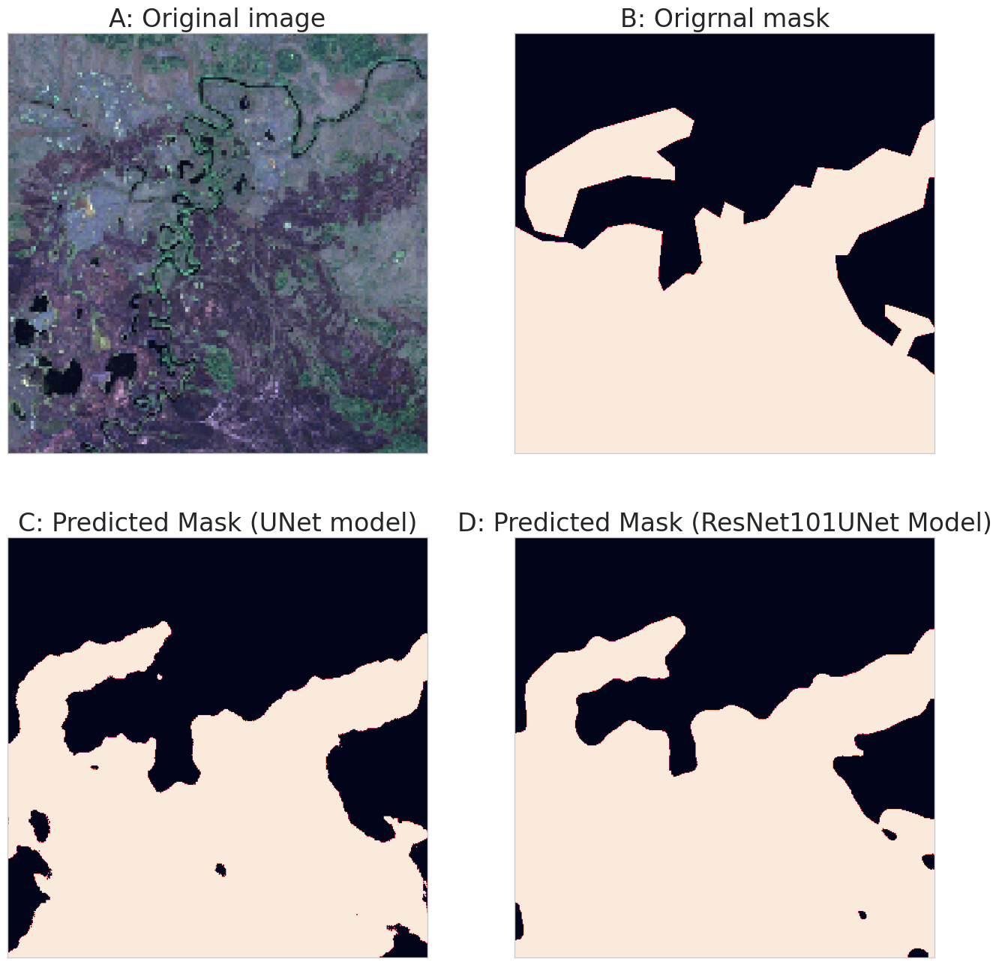

In [115]:
# original image/mask pair
image_original, mask_original = dataset_result[0]
# mask from UNet model
test_results_UNet = sorted(glob("/content/drive/MyDrive/Thesis/results/*.png"))
predicted_mask_my_model = imageio.imread(test_results_UNet[0])
# mask from ResNet101UNet model
test_results_ResNet101UNet = sorted(glob("results_pretrained/*.png"))
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[0])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_1.png', dpi=300, bbox_inches='tight')

**Test pair Nr. 2**

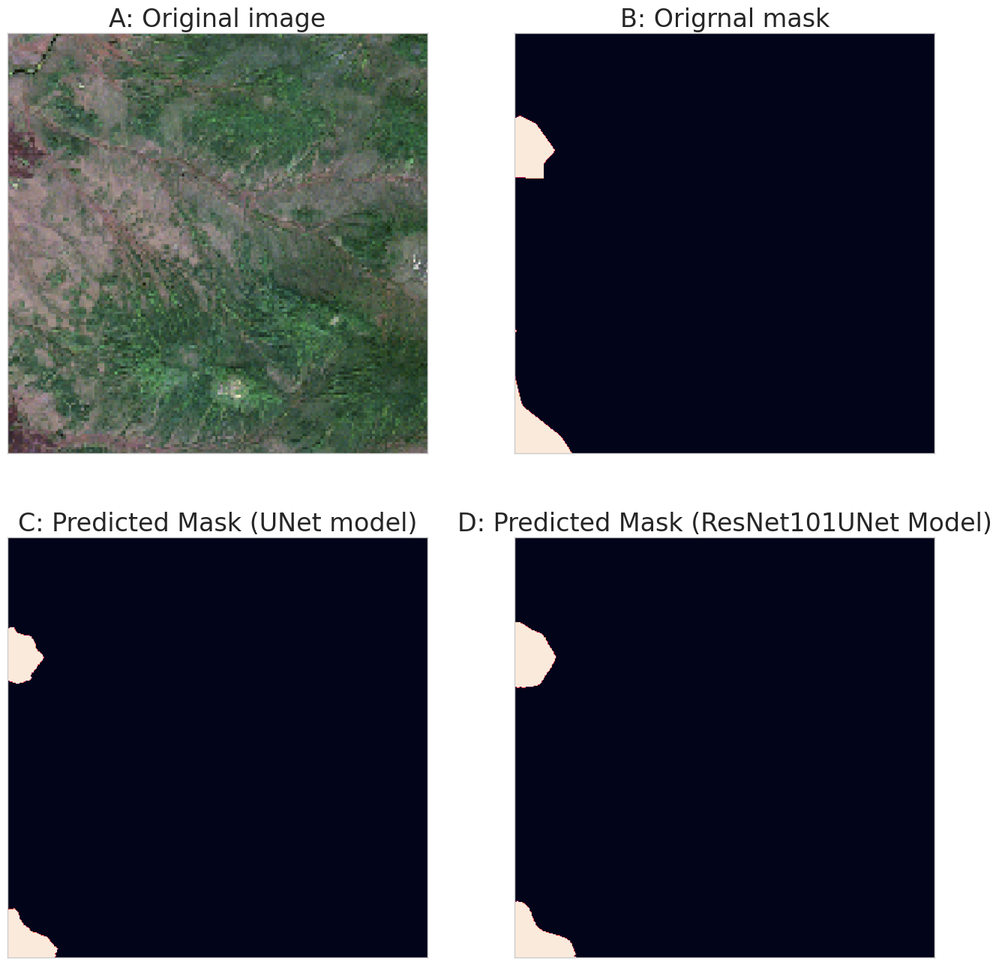

In [116]:
# original image/mask pair
image_original, mask_original = dataset_result[1]
# mask from UNet model
predicted_mask_my_model = imageio.imread(test_results_UNet[1])
# mask from ResNet101UNet model
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[1])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_2.png', dpi=300, bbox_inches='tight')

**Test pair Nr. 3**

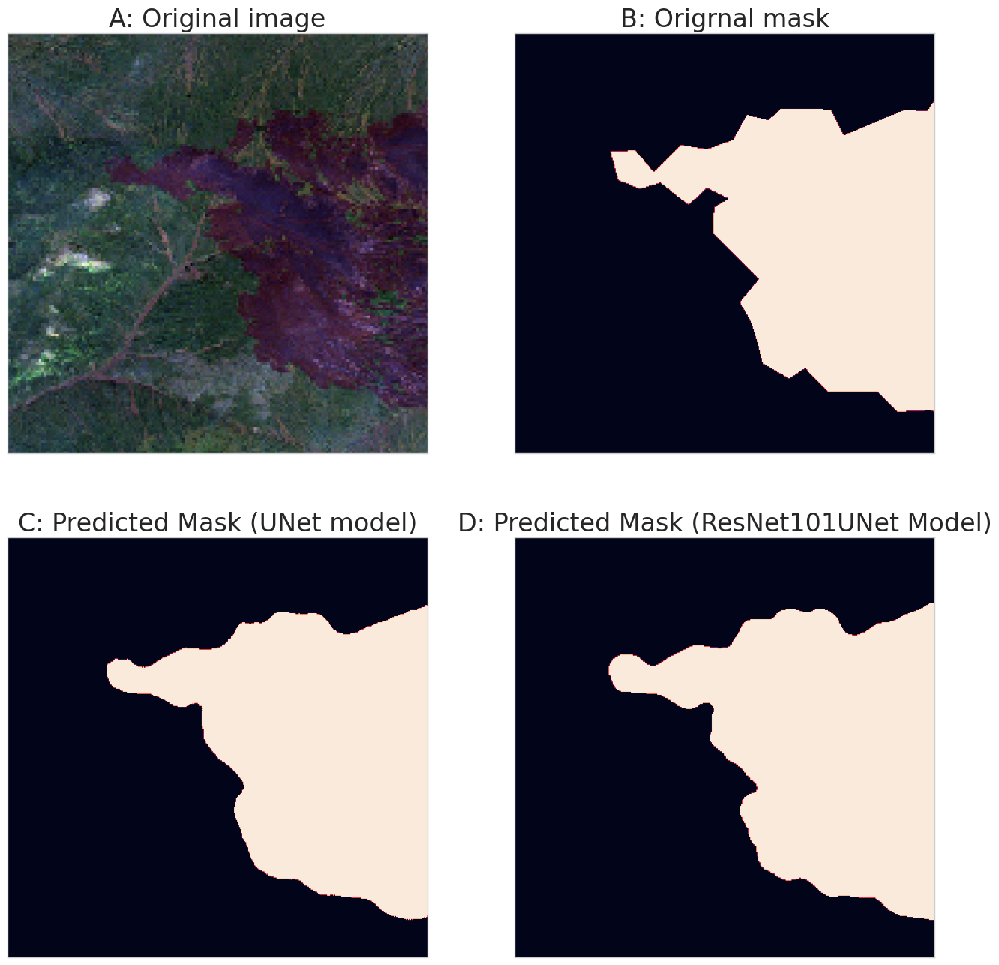

In [117]:
# original image/mask pair
image_original, mask_original = dataset_result[2]
# mask from UNet model
predicted_mask_my_model = imageio.imread(test_results_UNet[2])
# mask from ResNet101UNet model
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[2])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_3.png', dpi=300, bbox_inches='tight')

**Test pair Nr. 4**

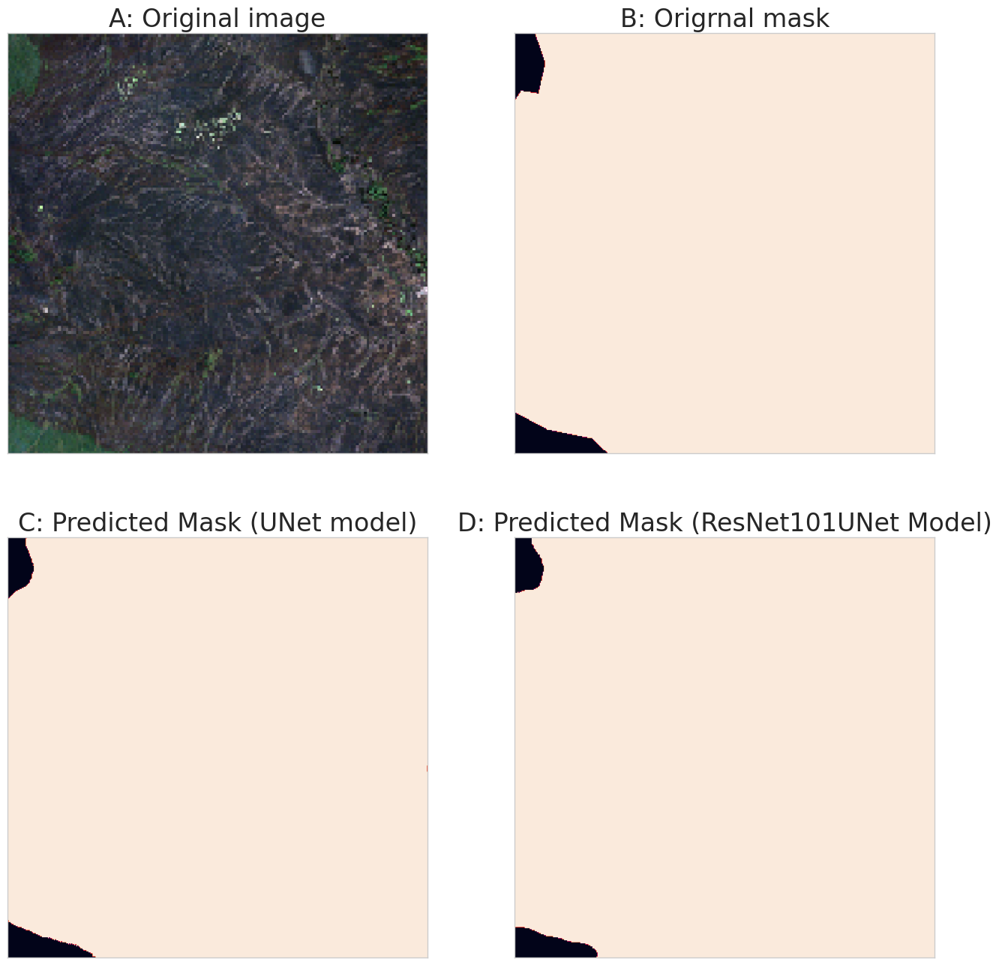

In [118]:
# original image/mask pair
image_original, mask_original = dataset_result[3]
# mask from UNet model
predicted_mask_my_model = imageio.imread(test_results_UNet[3])
# mask from ResNet101UNet model
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[3])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_4.png', dpi=300, bbox_inches='tight')

**Test pair Nr. 5**

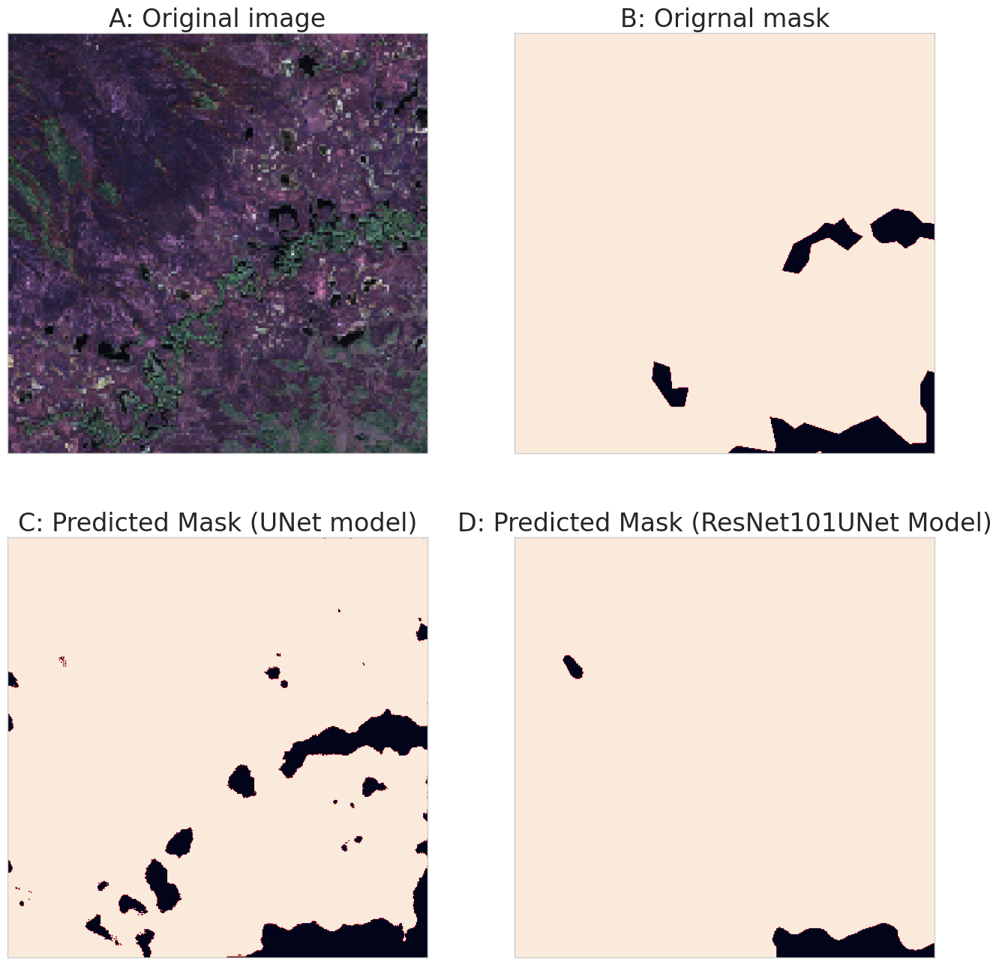

In [119]:
# original image/mask pair
image_original, mask_original = dataset_result[4]
# mask from UNet model
predicted_mask_my_model = imageio.imread(test_results_UNet[4])
# mask from ResNet101UNet model
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[4])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_5.png', dpi=300, bbox_inches='tight')

**Test pair Nr. 6**

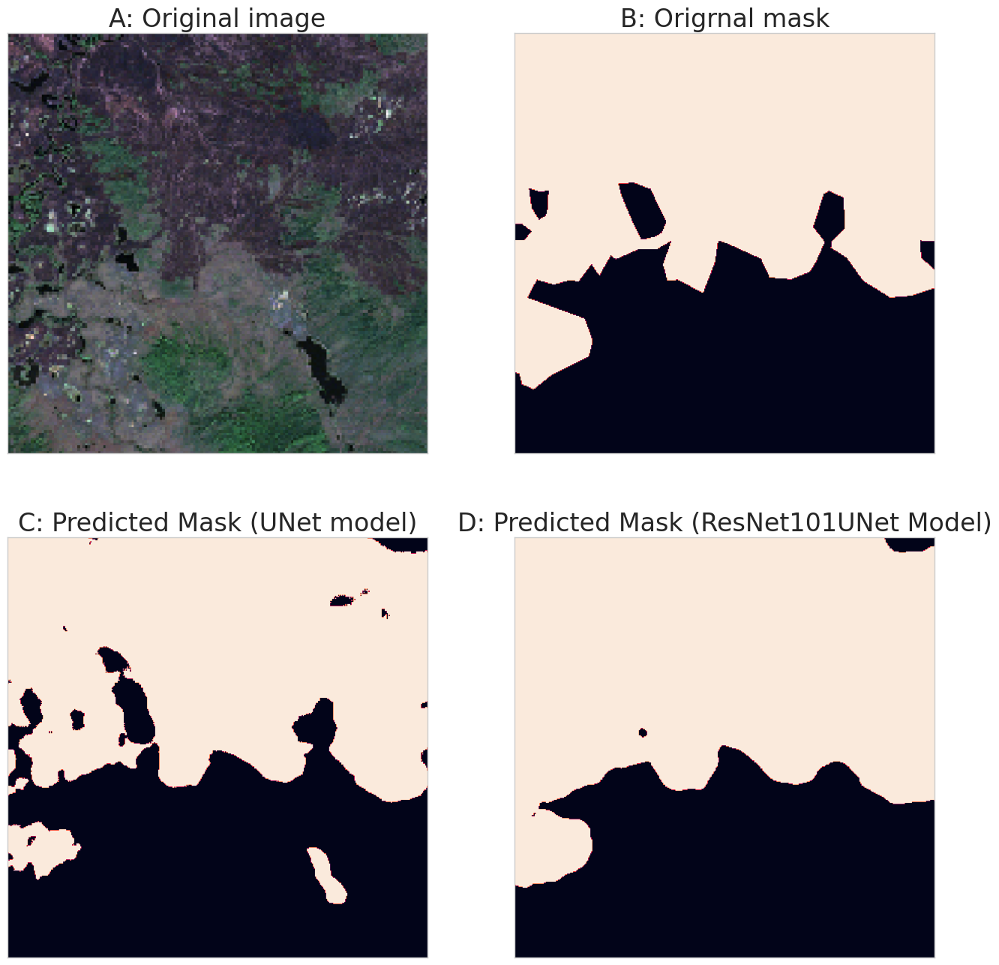

In [120]:
# original image/mask pair
image_original, mask_original = dataset_result[5]
# mask from UNet model
predicted_mask_my_model = imageio.imread(test_results_UNet[5])
# mask from ResNet101UNet model
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[5])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_6.png', dpi=300, bbox_inches='tight')

**Test pair Nr. 7**

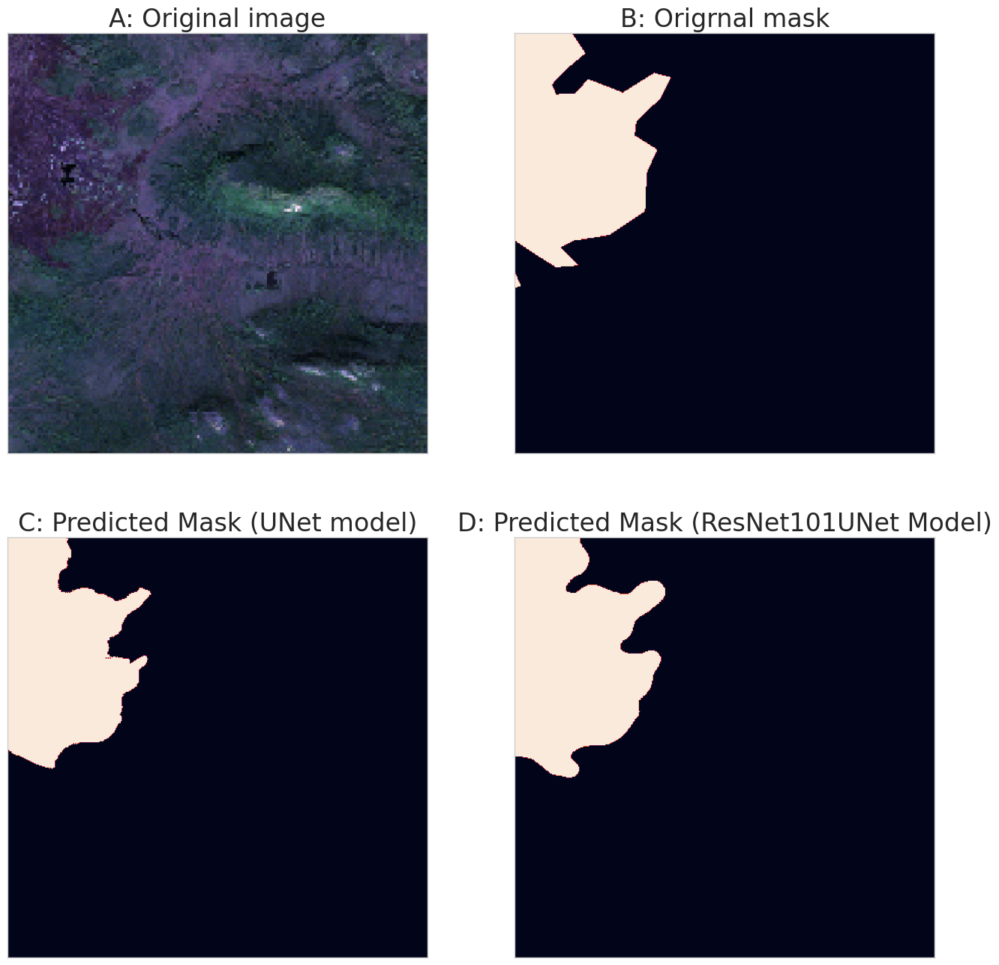

In [121]:
# original image/mask pair
image_original, mask_original = dataset_result[6]
# mask from UNet model
predicted_mask_my_model = imageio.imread(test_results_UNet[6])
# mask from ResNet101UNet model
predicted_mask_pretrained_model = imageio.imread(test_results_ResNet101UNet[6])

mask_original = np.squeeze(mask_original, axis=2)
visualize(image_original, mask_original, predicted_mask_my_model, predicted_mask_pretrained_model, in_rows=False)

plt.savefig('Prediction_7.png', dpi=300, bbox_inches='tight')